# Atividade A

In [3]:
import torch
import torch.nn.functional as F
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# 1. Carregar dataset Iris
iris = datasets.load_iris()
X = iris.data[:, [0, 2]]  # sepal length e petal length
y = iris.target

# 2. Filtrar apenas Setosa (0) e Versicolor (1)
mask = y < 2
X = X[mask]
y = y[mask]

# 3. Normalizar os dados
scaler = StandardScaler()
X = scaler.fit_transform(X)

# 4. Dividir em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 5. Converter para tensores
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)

# 6. Inicializar pesos com gradientes
torch.manual_seed(0)
w1 = torch.randn(2, 4, requires_grad=True)
w2 = torch.randn(4, 4, requires_grad=True)
w3 = torch.randn(4, 1, requires_grad=True)

# 6. Inicializar bias com gradientes
b1 = torch.randn(4, requires_grad=True)  # bias para primeira camada
b2 = torch.randn(4, requires_grad=True)  # bias para segunda camada 
b3 = torch.randn(1, requires_grad=True)  # bias para camada de saída

# 7. Definir otimizador e função de perda
optimizer = torch.optim.SGD([w1, w2, w3, b1, b2, b3], lr=0.1)
loss_fn = torch.nn.MSELoss()

# 8. Loop de treino
for epoch in range(300):
    # Forward manual
    z1 = torch.matmul(X_train, w1) + b1
    a1 = F.softplus(z1)
    z2 = torch.matmul(a1, w2) + b2
    a2 = F.softplus(z2)
    z3 = torch.matmul(a2, w3) + b3
    y_pred = torch.sigmoid(z3)

    # Loss (Erro Quadrático Médio)
    loss = loss_fn(y_pred, y_train)

    # Backpropagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Monitorar
    if epoch % 10 == 0:
        acc = ((y_pred > 0.5).float() == y_train).float().mean()
        print(f"Epoch {epoch:4d} | Loss: {loss.item():.4f} | Acurácia: {acc:.4f}")

# 9. Avaliação final
with torch.no_grad():
    z1 = torch.matmul(X_train, w1)
    a1 = F.softplus(z1)
    z2 = torch.matmul(a1, w2)
    a2 = F.softplus(z2)
    z3 = torch.matmul(a2, w3)
    y_pred = torch.sigmoid(z3)
    acc = ((y_pred > 0.5).float() == y_train).float().mean()
    print(f"\nAcurácia final no treino: {acc:.4f}")


Epoch    0 | Loss: 0.4792 | Acurácia: 0.4750
Epoch   10 | Loss: 0.3531 | Acurácia: 0.4750
Epoch   20 | Loss: 0.0826 | Acurácia: 0.9000
Epoch   30 | Loss: 0.0389 | Acurácia: 0.9500
Epoch   40 | Loss: 0.0224 | Acurácia: 0.9625
Epoch   50 | Loss: 0.0136 | Acurácia: 0.9875
Epoch   60 | Loss: 0.0089 | Acurácia: 0.9875
Epoch   70 | Loss: 0.0063 | Acurácia: 1.0000
Epoch   80 | Loss: 0.0047 | Acurácia: 1.0000
Epoch   90 | Loss: 0.0038 | Acurácia: 1.0000
Epoch  100 | Loss: 0.0032 | Acurácia: 1.0000
Epoch  110 | Loss: 0.0028 | Acurácia: 1.0000
Epoch  120 | Loss: 0.0025 | Acurácia: 1.0000
Epoch  130 | Loss: 0.0023 | Acurácia: 1.0000
Epoch  140 | Loss: 0.0021 | Acurácia: 1.0000
Epoch  150 | Loss: 0.0020 | Acurácia: 1.0000
Epoch  160 | Loss: 0.0019 | Acurácia: 1.0000
Epoch  170 | Loss: 0.0018 | Acurácia: 1.0000
Epoch  180 | Loss: 0.0017 | Acurácia: 1.0000
Epoch  190 | Loss: 0.0016 | Acurácia: 1.0000
Epoch  200 | Loss: 0.0016 | Acurácia: 1.0000
Epoch  210 | Loss: 0.0015 | Acurácia: 1.0000
Epoch  220

# Atividade B

In [6]:
import torch
import torch.nn.functional as F
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset

# 1. Carregar dataset Iris
iris = datasets.load_iris()
X = iris.data[:, [0, 2]]  # sepal length e petal length
y = iris.target

# 2. Filtrar apenas Setosa (0) e Versicolor (1)
mask = y < 2
X = X[mask]
y = y[mask]

# 3. Normalizar os dados
scaler = StandardScaler()
X = scaler.fit_transform(X)

# 4. Dividir em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 5. Converter para tensores e criar DataLoader
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)

# Criar Dataset e DataLoader para mini-batches
batch_size = 4
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# 6. Inicializar pesos com gradientes
torch.manual_seed(0)
w1 = torch.randn(2, 4, requires_grad=True)
w2 = torch.randn(4, 4, requires_grad=True)
w3 = torch.randn(4, 1, requires_grad=True)

# 6. Inicializar bias com gradientes
b1 = torch.randn(4, requires_grad=True)  # bias para primeira camada
b2 = torch.randn(4, requires_grad=True)  # bias para segunda camada 
b3 = torch.randn(1, requires_grad=True)  # bias para camada de saída

# 7. Definir otimizador e função de perda
optimizer = torch.optim.SGD([w1, w2, w3, b1, b2, b3], lr=0.1)
loss_fn = torch.nn.MSELoss()

# 8. Loop de treino com mini-batches
for epoch in range(300):
    epoch_loss = 0.0
    correct = 0
    total = 0
    
    for batch_X, batch_y in train_loader:
        # Forward manual
        z1 = torch.matmul(batch_X, w1) + b1
        a1 = F.softplus(z1)
        z2 = torch.matmul(a1, w2) + b2
        a2 = F.softplus(z2)
        z3 = torch.matmul(a2, w3) + b3
        batch_pred = torch.sigmoid(z3)

        # Loss (Erro Quadrático Médio)
        loss = loss_fn(batch_pred, batch_y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Acumular estatísticas
        epoch_loss += loss.item()
        correct += ((batch_pred > 0.5).float() == batch_y).float().sum()
        total += batch_y.size(0)
    
    # Monitorar
    if epoch % 10 == 0:
        avg_loss = epoch_loss / len(train_loader)
        acc = correct / total
        print(f"Epoch {epoch:4d} | Loss: {avg_loss:.4f} | Acurácia: {acc:.4f}")

# 9. Avaliação final em todos os dados de treino
with torch.no_grad():
    z1 = torch.matmul(X_train, w1) + b1
    a1 = F.softplus(z1)
    z2 = torch.matmul(a1, w2) + b2
    a2 = F.softplus(z2)
    z3 = torch.matmul(a2, w3) + b3
    y_pred = torch.sigmoid(z3)
    acc = ((y_pred > 0.5).float() == y_train).float().mean()
    print(f"\nAcurácia final no treino: {acc:.4f}")

Epoch    0 | Loss: 0.3344 | Acurácia: 0.5750
Epoch   10 | Loss: 0.0016 | Acurácia: 1.0000
Epoch   20 | Loss: 0.0009 | Acurácia: 1.0000
Epoch   30 | Loss: 0.0007 | Acurácia: 1.0000
Epoch   40 | Loss: 0.0005 | Acurácia: 1.0000
Epoch   50 | Loss: 0.0004 | Acurácia: 1.0000
Epoch   60 | Loss: 0.0003 | Acurácia: 1.0000
Epoch   70 | Loss: 0.0003 | Acurácia: 1.0000
Epoch   80 | Loss: 0.0002 | Acurácia: 1.0000
Epoch   90 | Loss: 0.0002 | Acurácia: 1.0000
Epoch  100 | Loss: 0.0002 | Acurácia: 1.0000
Epoch  110 | Loss: 0.0002 | Acurácia: 1.0000
Epoch  120 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  130 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  140 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  150 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  160 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  170 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  180 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  190 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  200 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  210 | Loss: 0.0001 | Acurácia: 1.0000
Epoch  220

# Atividade C

### 🧠 Classificação com Perceptron no Dataset Iris (Setosa vs Versicolor)

Este notebook executa um experimento de classificação binária usando o algoritmo **Perceptron** sobre um subconjunto do **dataset Iris**, focando em duas classes e duas features.

---

### 📥 1. Carregamento do Dataset

Os dados são carregados diretamente do repositório da UCI.

```python
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data', header=None)
```

---

### 🧪 2. Seleção de Classes e Atributos
Selecionamos somente 2 classes (as 100 primeiras amostras):

- Iris-setosa → será rotulada como -1

- Iris-versicolor → será rotulada como +1

Também selecionamos apenas duas features:

- Comprimento da sépala (sepal length, coluna 0)

- Comprimento da pétala (petal length, coluna 2)

```python
y = df.iloc[0:100, 4].values
y = np.where(y == 'Iris-setosa', -1, 1)
X = df.iloc[0:100, [0, 2]].values
```

---

### 📊 3. Visualização dos Dados
Os dados são representados com dois tipos de marcadores:

- Iris-setosa: marcadores vermelhos circulares

- Iris-versicolor: marcadores azuis em X

```python
plt.scatter(X[:50, 0], X[:50, 1], color='red', marker='o', label='setosa')
plt.scatter(X[50:100, 0], X[50:100, 1], color='blue', marker='x', label='versicolor')
```

---

### 🤖 4. Treinamento do Perceptron
O Perceptron é instanciado com os seguintes parâmetros:

- Taxa de aprendizado (eta) = 0.1

- Número de épocas (n_iter) = 10

```python
ppn = Perceptron(eta=0.1, n_iter=10)
ppn.fit(X, y)
```
Durante o treinamento, o modelo ajusta os pesos a cada erro de classificação.

---

### 📈 5. Erros por Época
O gráfico a seguir mostra o número de erros de classificação por época, o que indica o progresso do aprendizado do Perceptron.

```python
plt.plot(range(1, len(ppn.errors_) + 1), ppn.errors_, marker='o')
plt.xlabel('Epochs')
plt.ylabel('Number of updates')
```

---

### 🧩 6. Função para Plotar a Região de Decisão
A função plot_decision_regions() cria uma visualização que mostra:

- As regiões do espaço onde o Perceptron classifica como uma ou outra classe

- As fronteiras de decisão

- Os pontos reais com suas classes verdadeiras

Ela faz isso por:

- Criação de uma malha (np.meshgrid)

- Previsão dos valores com classifier.predict()

- Preenchimento da área com contourf

---

### 🖼️ 7. Visualização Final
Por fim, plota-se a fronteira de decisão junto aos dados reais para avaliar a performance do classificador:

```python
plot_decision_regions(X, y, classifier=ppn)
plt.xlabel('sepal length [cm]')
plt.ylabel('petal length [cm]')
plt.legend(loc='upper left')
```

### ✅ Conclusão
Esse experimento mostra como o algoritmo Perceptron:

- Pode ser aplicado a problemas de classificação linearmente separáveis

- Ajusta os pesos com base em erros de classificação

- Converge rapidamente em problemas simples como o subconjunto do Iris

- Além disso, ilustra visualmente o comportamento da fronteira de decisão do modelo.

# Atividade D

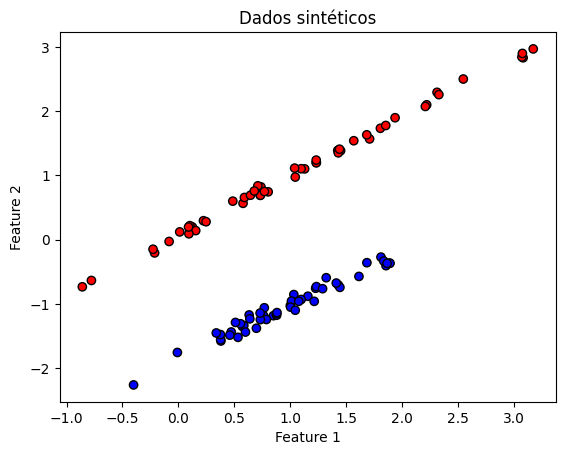

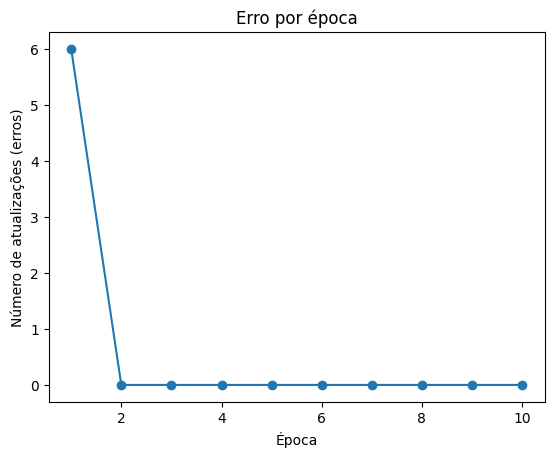

/tmp/ipykernel_6918/1249019663.py:82: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(x=X[y == cl, 0],


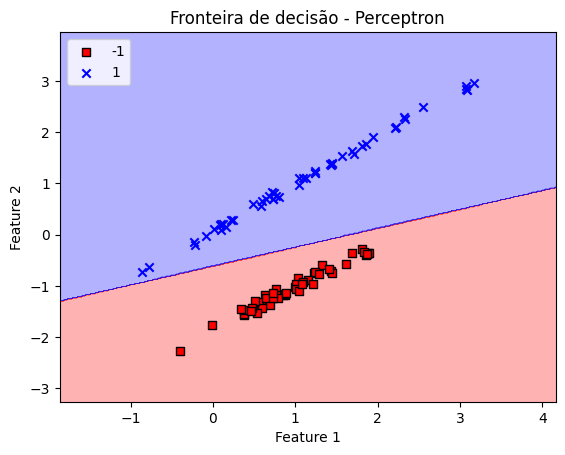

In [111]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from matplotlib.colors import ListedColormap

# Gerar dados sintéticos
X, y = make_classification(n_samples=100, n_features=2, n_classes=2,
                           n_clusters_per_class=1, n_redundant=0, random_state=42)

# Ajustar rótulos para -1 e 1 (como esperado pelo Perceptron)
y = np.where(y == 0, -1, 1)

# Visualizar os dados
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='bwr', edgecolor='k')
plt.title("Dados sintéticos")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

# --- Perceptron simples ---
class Perceptron:
    def __init__(self, eta=0.01, n_iter=10):
        self.eta = eta
        self.n_iter = n_iter

    def fit(self, X, y):
        self.weights_ = np.zeros(1 + X.shape[1])
        self.errors_ = []

        for _ in range(self.n_iter):
            errors = 0
            for xi, target in zip(X, y):
                update = self.eta * (target - self.predict(xi))
                self.weights_[1:] += update * xi
                self.weights_[0] += update
                errors += int(update != 0.0)
            self.errors_.append(errors)
        return self

    def net_input(self, X):
        return np.dot(X, self.weights_[1:]) + self.weights_[0]

    def predict(self, X):
        return np.where(self.net_input(X) >= 0.0, 1, -1)

# Treinar o modelo
ppn = Perceptron(eta=0.1, n_iter=10)
ppn.fit(X, y)

# Plotar número de erros por época
plt.plot(range(1, len(ppn.errors_) + 1), ppn.errors_, marker='o')
plt.xlabel('Época')
plt.ylabel('Número de atualizações (erros)')
plt.title('Erro por época')
plt.show()

# --- Plotar regiões de decisão ---
def plot_decision_regions(X, y, classifier, resolution=0.02):
    markers = ('s', 'x')
    colors = ('red', 'blue')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # Limites
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    # Malha
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))

    # Previsões
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)

    # Contorno
    plt.contourf(xx1, xx2, Z, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    # Dados
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0],
                    y=X[y == cl, 1],
                    c=colors[idx],
                    label=cl,
                    marker=markers[idx],
                    edgecolor='black')

# Mostrar regiões de decisão
plot_decision_regions(X, y, classifier=ppn)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Fronteira de decisão - Perceptron')
plt.legend(loc='upper left')
plt.show()


# Atividade E

In [76]:
import numpy as np

# Dados
X = np.array([0.5, 2.3, 2.9])
y = np.array([1.4, 1.9, 3.2])
n = len(X)

# Inicialização
w = 1.0
b = 0.0
learning_rate = 0.01
tolerance = 0.0001
max_epochs = 10000  # Segurança


#dSSR_intercept1 = -2*(1.4 -( b + w * 0.5))
#dSSR_intercept2 = -2*(1.9 -( b + w * 2.3))
#dSSR_intercept3 = -2*(3.2 -( b + w * 2.9))

#dSSR_intercept1 = -2*0.5*(1.4 -( b + w * 0.5))
#dSSR_intercept2 = -2*2.3*(1.9 -( b + w * 2.3))
#dSSR_intercept3 = -2*2.9*(3.2 -( b + w * 2.9))

""""
dSSR_intercept = -2*(1.4 -( b + w * 0.5)) + -2*(1.9 -( b + w * 2.3)) + -2*(3.2 -( b + w * 2.9))

dSSR_slope = -2*0.5*(1.4 -( b + w * 0.5)) + -2*2.3*(1.9 -( b + w * 2.3)) + -2*2.9*(3.2 -( b + w * 2.9))

stepSize_intercept = dSSR_intercept * learning_rate
stepSize_slope = dSSR_slope * learning_rate

New_Intercept = b
New_Slope = w

if epoch == 0:
    New_Intercept = b - stepSize_intercept
    New_Slope = w - stepSize_slope
else:
    New_Intercept = New_Intercept - stepSize_intercept
    New_Slope = New_Slope - stepSize_slope

print(f"dSSR_intercept: {dSSR_intercept:.3f} e dSSR_slope: {dSSR_slope:.3f}")
print(f"stepSize_intercept: {stepSize_intercept:.3f} e stepSize_slope: {stepSize_slope:.3f}")
print(f"New_Intercept: {New_Intercept:.3f} e New_Slope: {New_Slope:.3f}")
"""

print(f"Inicialização inclinação {w} e Interceção {b}")
for epoch in range(max_epochs):

    dSSR_intercept = -2*(1.4 -( b + w * 0.5)) + -2*(1.9 -( b + w * 2.3)) + -2*(3.2 -( b + w * 2.9))

    dSSR_slope = -2*0.5*(1.4 -( b + w * 0.5)) + -2*2.3*(1.9 -( b + w * 2.3)) + -2*2.9*(3.2 -( b + w * 2.9))

    stepSize_intercept = dSSR_intercept * learning_rate
    stepSize_slope = dSSR_slope * learning_rate

    b = b - stepSize_intercept
    w = w - stepSize_slope

    print(f"\nEpoca: {epoch}")
    print(f"dSSR_intercept: {dSSR_intercept:.3f} e dSSR_slope: {dSSR_slope:.3f}")
    print(f"stepSize_intercept: {stepSize_intercept:.3f} e stepSize_slope: {stepSize_slope:.3f}")
    print(f"New_Intercept: {b:.3f} e New_Slope: {w:.3f}")

    if stepSize_intercept and stepSize_slope > 0.0001:
        print("\nchegou na condição de parada")
        print(f"Step_Interceptação = {stepSize_intercept}, Step_Inclinação = {stepSize_slope}")
        print(f"Interceptação = {b}, Inclinação = {w}")
        break

    # Previsões
    #y_pred = w * X + b
    #errors = y_pred - y

    # Derivadas da soma dos erros residuais
    #dw = np.sum(errors * X)
    #db = np.sum(errors)

    #db = 2*db
    #dw = 2*dw

    #print(dw , db)

    # Atualizações
    #w_new = w - learning_rate * dw
    #b_new = b - learning_rate * db

    # Condição de parada
    #if abs(w_new - w) < tolerance and abs(b_new - b) < tolerance:
    #    print(f"\nConvergência atingida na época {epoch}")
    #    break

    #w, b = w_new, b_new

    # Log
    #print(f"Época {epoch}: w = {w:.3f}, b = {b:.3f}, dw = {dw:.3f}, db = {db:.3f}")

# Resultado final
print(f"\nParâmetros finais:")
print(f"Inclinação (w): {w:.6f}")
print(f"Interceptação (b): {b:.6f}")


Inicialização inclinação 1.0 e Interceção 0.0

Epoca: 0
dSSR_intercept: -1.600 e dSSR_slope: -0.800
stepSize_intercept: -0.016 e stepSize_slope: -0.008
New_Intercept: 0.016 e New_Slope: 1.008

Epoca: 1
dSSR_intercept: -1.413 e dSSR_slope: -0.394
stepSize_intercept: -0.014 e stepSize_slope: -0.004
New_Intercept: 0.030 e New_Slope: 1.012

Epoca: 2
dSSR_intercept: -1.283 e dSSR_slope: -0.123
stepSize_intercept: -0.013 e stepSize_slope: -0.001
New_Intercept: 0.043 e New_Slope: 1.013

Epoca: 3
dSSR_intercept: -1.192 e dSSR_slope: 0.057
stepSize_intercept: -0.012 e stepSize_slope: 0.001
New_Intercept: 0.055 e New_Slope: 1.013

chegou na condição de parada
Step_Interceptação = -0.011920296112000007, Step_Inclinação = 0.0005736841839999807
Interceptação = 0.05487900011200002, Inclinação = 1.012603347816

Parâmetros finais:
Inclinação (w): 1.012603
Interceptação (b): 0.054879


In [77]:
import numpy as np

# Dados
X = np.array([0.5, 2.3, 2.9])
y = np.array([1.4, 1.9, 3.2])

# Inicialização
w = 1.0
b = 0.0
learning_rate = 0.01
tolerance = 0.0001
max_epochs = 10000

print(f"Inicialização: inclinação = {w}, interceptação = {b}")

for epoch in range(max_epochs):
    # Previsões
    y_pred = w * X + b
    errors = y - y_pred

    # Gradientes
    dSSR_intercept = -2 * np.sum(errors)
    dSSR_slope = -2 * np.sum(errors * X)

    # Passos
    stepSize_intercept = learning_rate * dSSR_intercept
    stepSize_slope = learning_rate * dSSR_slope

    # Atualizações
    b -= stepSize_intercept
    w -= stepSize_slope

    print(f"\nÉpoca: {epoch}")
    print(f"Gradientes → interceptação: {dSSR_intercept:.4f}, inclinação: {dSSR_slope:.4f}")
    print(f"Passos     → interceptação: {stepSize_intercept:.4f}, inclinação: {stepSize_slope:.4f}")
    print(f"Atualizado → interceptação: {b:.4f}, inclinação: {w:.4f}")

    # Condição de parada
    if abs(stepSize_intercept) < tolerance and abs(stepSize_slope) < tolerance:
        print("\n✅ Convergência atingida!")
        break

# Resultado final
print(f"\n🔚 Parâmetros finais:")
print(f"Inclinação (w): {w:.6f}")
print(f"Interceptação (b): {b:.6f}")


Inicialização: inclinação = 1.0, interceptação = 0.0

Época: 0
Gradientes → interceptação: -1.6000, inclinação: -0.8000
Passos     → interceptação: -0.0160, inclinação: -0.0080
Atualizado → interceptação: 0.0160, inclinação: 1.0080

Época: 1
Gradientes → interceptação: -1.4128, inclinação: -0.3944
Passos     → interceptação: -0.0141, inclinação: -0.0039
Atualizado → interceptação: 0.0301, inclinação: 1.0119

Época: 2
Gradientes → interceptação: -1.2831, inclinação: -0.1233
Passos     → interceptação: -0.0128, inclinação: -0.0012
Atualizado → interceptação: 0.0430, inclinação: 1.0132

Época: 3
Gradientes → interceptação: -1.1920, inclinação: 0.0574
Passos     → interceptação: -0.0119, inclinação: 0.0006
Atualizado → interceptação: 0.0549, inclinação: 1.0126

Época: 4
Gradientes → interceptação: -1.1270, inclinação: 0.1773
Passos     → interceptação: -0.0113, inclinação: 0.0018
Atualizado → interceptação: 0.0661, inclinação: 1.0108

Época: 5
Gradientes → interceptação: -1.0796, inclinaçã

In [78]:
import numpy as np

# Dados
X = np.array([0.5, 2.3, 2.9])
y = np.array([1.4, 1.9, 3.2])

# Inicialização
w = 1.0
b = 0.0
learning_rate = 0.01
tolerance = 0.0001
max_epochs = 10000

print(f"Inicialização: inclinação = {w}, interceptação = {b}")

for epoch in range(max_epochs):
    convergiu = True  # Assumimos convergência, testaremos abaixo
    
    for i in range(len(X)):
        xi = X[i]
        yi = y[i]

        # Previsão para o ponto i
        y_pred = w * xi + b
        error = yi - y_pred

        # Gradientes (derivadas da SSR)
        dSSR_w = -2 * xi * error
        dSSR_b = -2 * error

        # Passos
        step_w = learning_rate * dSSR_w
        step_b = learning_rate * dSSR_b

        # Atualizações
        w -= step_w
        b -= step_b

        # Verifica se algum passo ainda é significativo
        if abs(step_w) >= tolerance or abs(step_b) >= tolerance:
            convergiu = False

        print(f"\nÉpoca {epoch} - Amostra {i}:")
        print(f"xi = {xi:.2f}, yi = {yi:.2f}, erro = {error:.4f}")
        print(f"Gradientes → dw = {dSSR_w:.4f}, db = {dSSR_b:.4f}")
        print(f"Passos     → step_w = {step_w:.4f}, step_b = {step_b:.4f}")
        print(f"Parâmetros → w = {w:.4f}, b = {b:.4f}")

    if convergiu:
        print(f"\n✅ Convergência atingida na época {epoch}.")
        break

# Resultado final
print(f"\n🔚 Parâmetros finais:")
print(f"Inclinação (w): {w:.6f}")
print(f"Interceptação (b): {b:.6f}")


Inicialização: inclinação = 1.0, interceptação = 0.0

Época 0 - Amostra 0:
xi = 0.50, yi = 1.40, erro = 0.9000
Gradientes → dw = -0.9000, db = -1.8000
Passos     → step_w = -0.0090, step_b = -0.0180
Parâmetros → w = 1.0090, b = 0.0180

Época 0 - Amostra 1:
xi = 2.30, yi = 1.90, erro = -0.4387
Gradientes → dw = 2.0180, db = 0.8774
Passos     → step_w = 0.0202, step_b = 0.0088
Parâmetros → w = 0.9888, b = 0.0092

Época 0 - Amostra 2:
xi = 2.90, yi = 3.20, erro = 0.3232
Gradientes → dw = -1.8745, db = -0.6464
Passos     → step_w = -0.0187, step_b = -0.0065
Parâmetros → w = 1.0076, b = 0.0157

Época 1 - Amostra 0:
xi = 0.50, yi = 1.40, erro = 0.8805
Gradientes → dw = -0.8805, db = -1.7611
Passos     → step_w = -0.0088, step_b = -0.0176
Parâmetros → w = 1.0164, b = 0.0333

Época 1 - Amostra 1:
xi = 2.30, yi = 1.90, erro = -0.4710
Gradientes → dw = 2.1664, db = 0.9419
Passos     → step_w = 0.0217, step_b = 0.0094
Parâmetros → w = 0.9947, b = 0.0239

Época 1 - Amostra 2:
xi = 2.90, yi = 3.20,

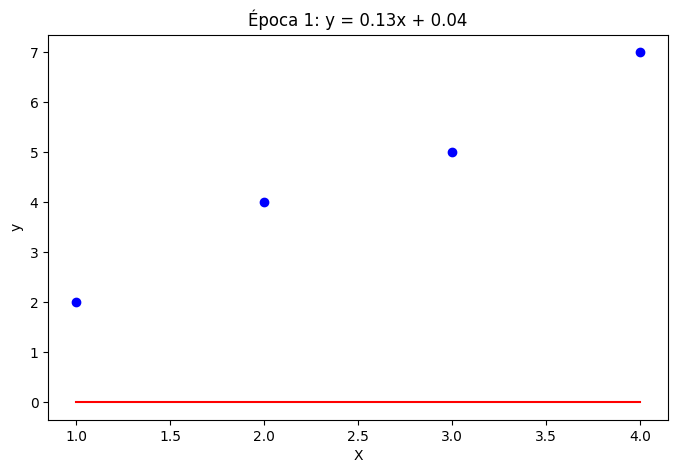

Época 1:
Erro: [-2. -4. -5. -7.]
dw: -13.2500, db: -4.5000
w: 0.1325, b: 0.0450



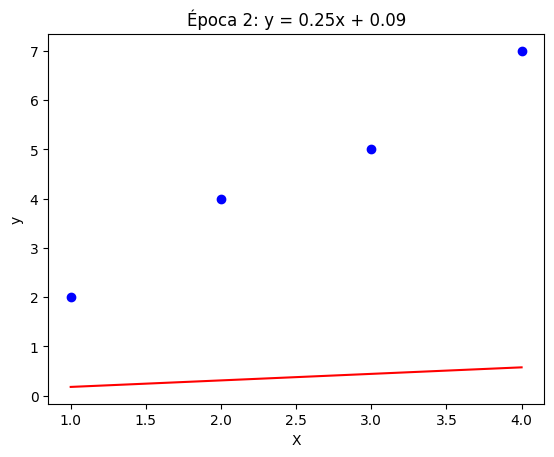

Época 2:
Erro: [-1.8225 -3.69   -4.5575 -6.425 ]
dw: -12.1438, db: -4.1238
w: 0.2539, b: 0.0862



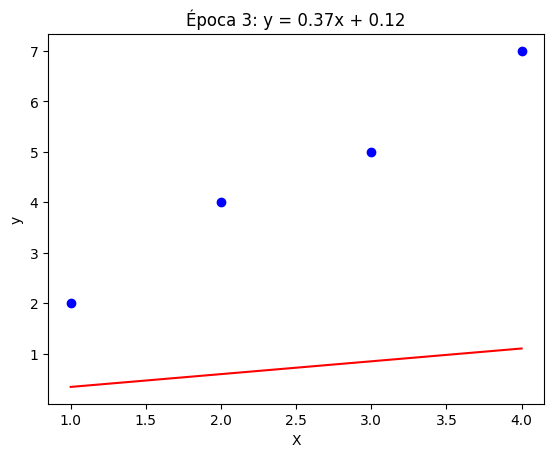

Época 3:
Erro: [-1.659825  -3.4058875 -4.15195   -5.8980125]
dw: -11.1299, db: -3.7789
w: 0.3652, b: 0.1240



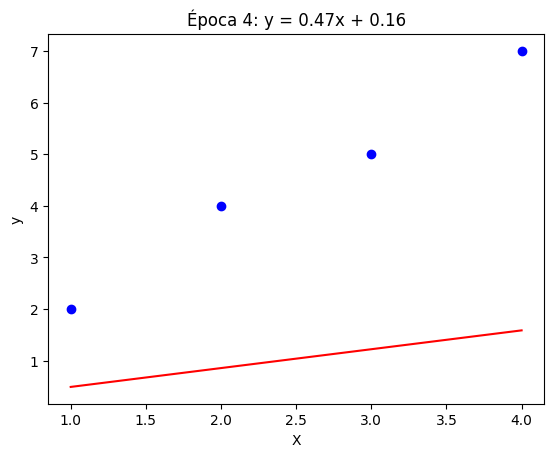

Época 4:
Erro: [-1.51073706 -3.14550081 -3.78026456 -5.41502831]
dw: -10.2007, db: -3.4629
w: 0.4672, b: 0.1587



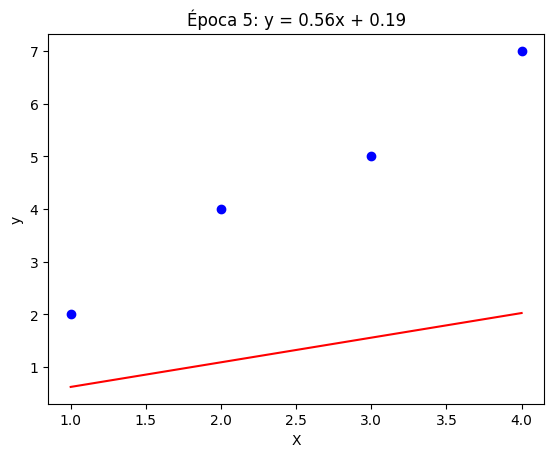

Época 5:
Erro: [-1.37410162 -2.90685876 -3.43961589 -4.97237303]
dw: -9.3490, db: -3.1732
w: 0.5607, b: 0.1904



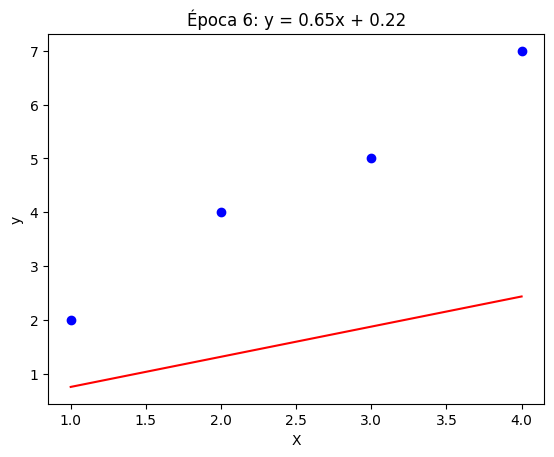

Época 6:
Erro: [-1.24887885 -2.68814559 -3.12741233 -4.56667907]
dw: -8.5685, db: -2.9078
w: 0.6464, b: 0.2195



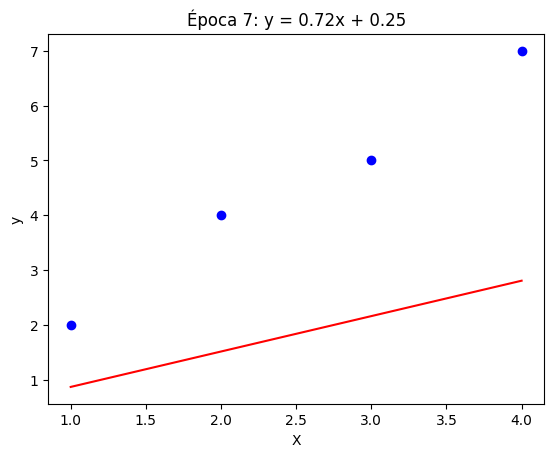

Época 7:
Erro: [-1.13411575 -2.48769718 -2.84127861 -4.19486004]
dw: -7.8532, db: -2.6645
w: 0.7250, b: 0.2461



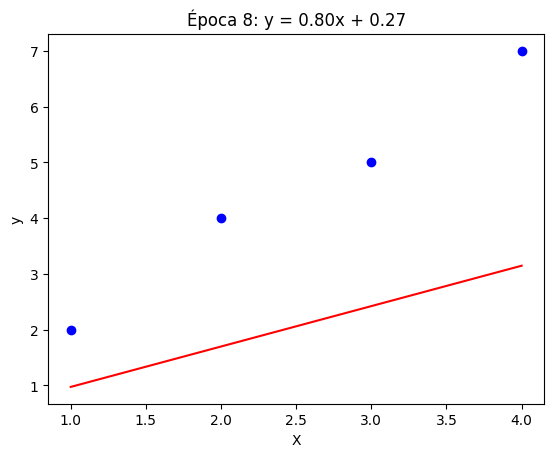

Época 8:
Erro: [-1.02893891 -2.30398837 -2.57903784 -3.8540873 ]
dw: -7.1976, db: -2.4415
w: 0.7969, b: 0.2705



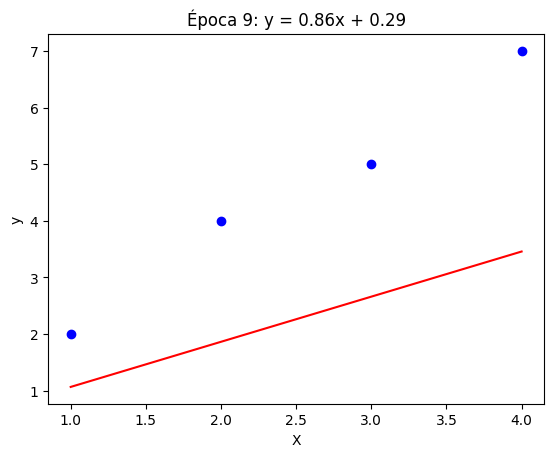

Época 9:
Erro: [-0.93254783 -2.13562135 -2.33869487 -3.54176839]
dw: -6.5967, db: -2.2372
w: 0.8629, b: 0.2929



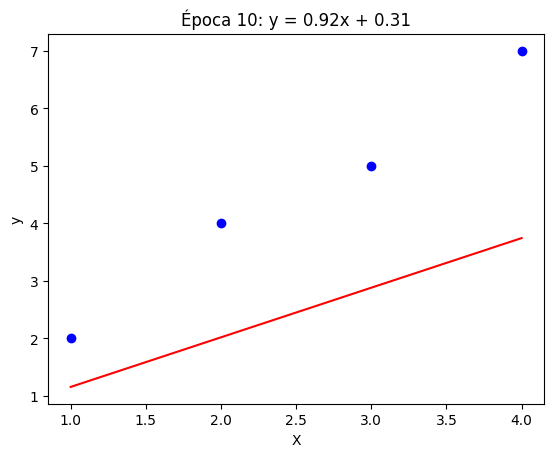

Época 10:
Erro: [-0.84420888 -1.98131503 -2.11842117 -3.25552732]
dw: -6.0461, db: -2.0499
w: 0.9234, b: 0.3134



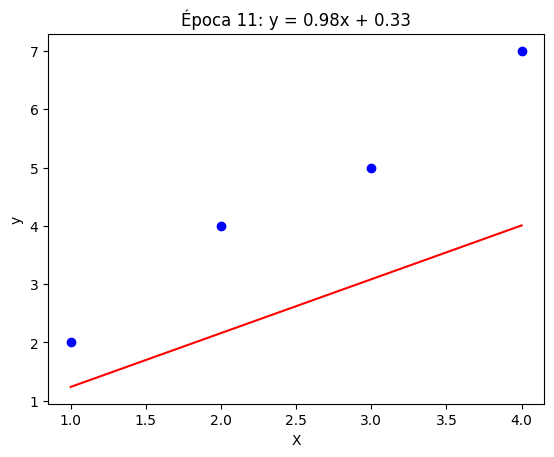

Época 11:
Erro: [-0.76324967 -1.83989529 -1.9165409  -2.99318652]
dw: -5.5414, db: -1.8782
w: 0.9788, b: 0.3322



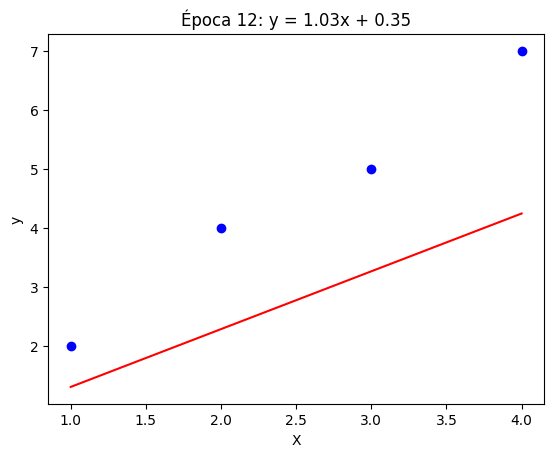

Época 12:
Erro: [-0.68905397 -1.71028606 -1.73151816 -2.75275025]
dw: -5.0788, db: -1.7209
w: 1.0296, b: 0.3494



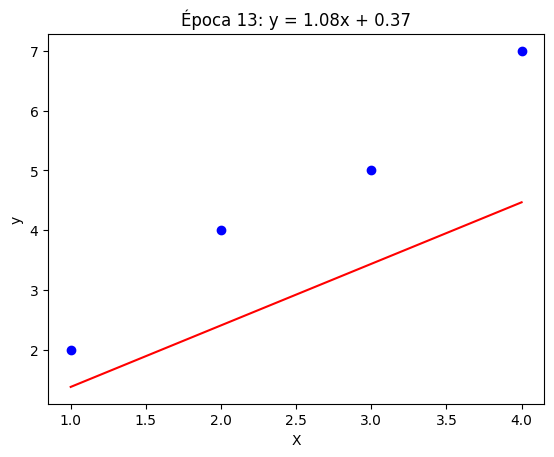

Época 13:
Erro: [-0.62105699 -1.59150113 -1.56194527 -2.53238941]
dw: -4.6549, db: -1.5767
w: 1.0761, b: 0.3652



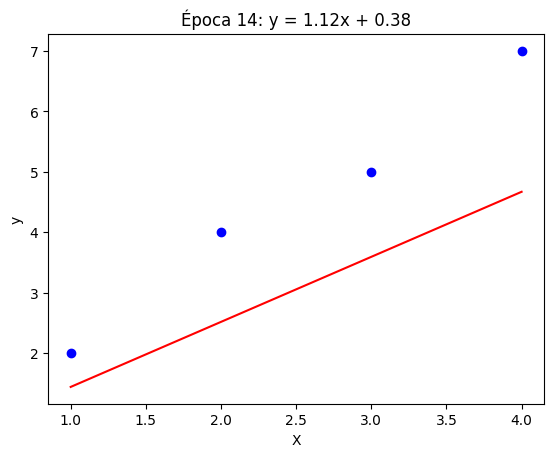

Época 14:
Erro: [-0.55874113 -1.48263664 -1.40653215 -2.33042766]
dw: -4.2663, db: -1.4446
w: 1.1188, b: 0.3796



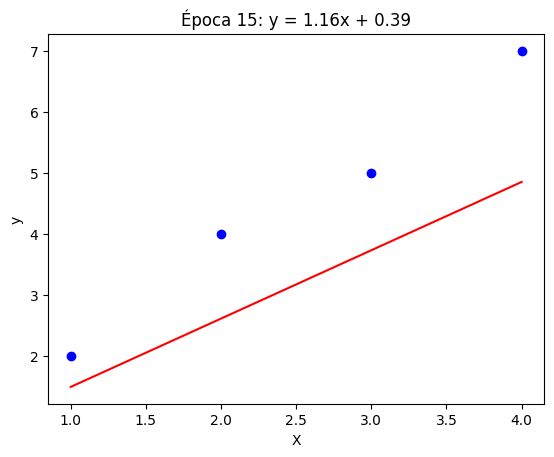

Época 15:
Erro: [-0.50163198 -1.38286418 -1.26409639 -2.1453286 ]
dw: -3.9102, db: -1.3235
w: 1.1579, b: 0.3928



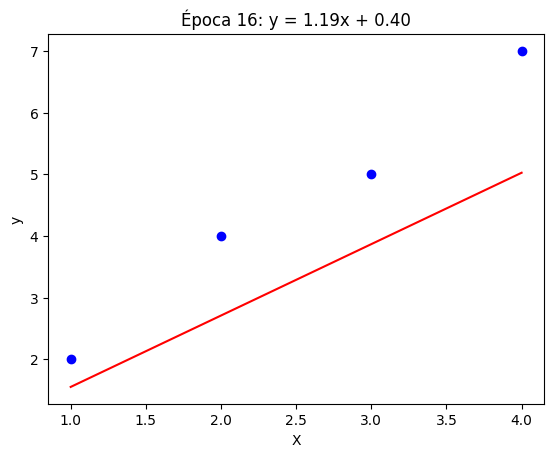

Época 16:
Erro: [-0.44929477 -1.29142456 -1.13355436 -1.97568415]
dw: -3.5839, db: -1.2125
w: 1.1937, b: 0.4050



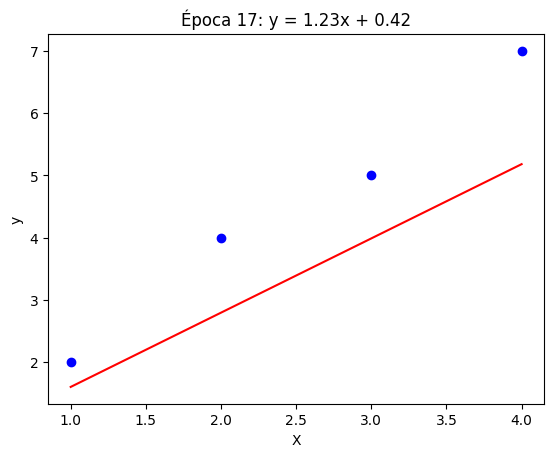

Época 17:
Erro: [-0.40133101 -1.20762195 -1.01391289 -1.82020382]
dw: -3.2848, db: -1.1108
w: 1.2266, b: 0.4161



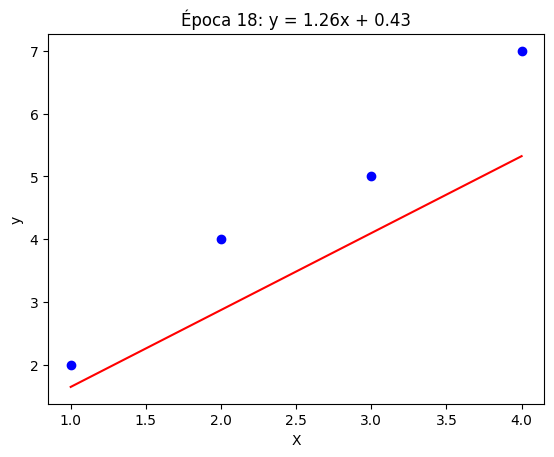

Época 18:
Erro: [-0.35737552 -1.13081863 -0.90426175 -1.67770486]
dw: -3.0107, db: -1.0175
w: 1.2567, b: 0.4262



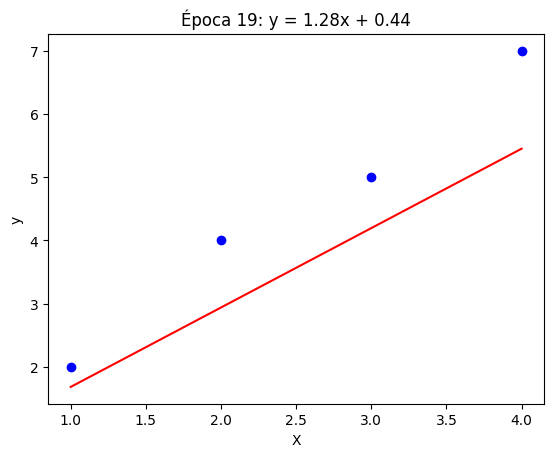

Época 19:
Erro: [-0.31709357 -1.06043014 -0.80376671 -1.54710328]
dw: -2.7594, db: -0.9321
w: 1.2843, b: 0.4356



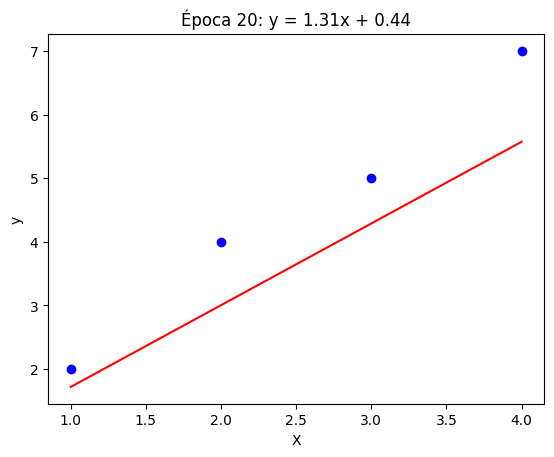

Época 20:
Erro: [-0.28017842 -0.99592082 -0.71166323 -1.42740563]
dw: -2.5292, db: -0.8538
w: 1.3095, b: 0.4441



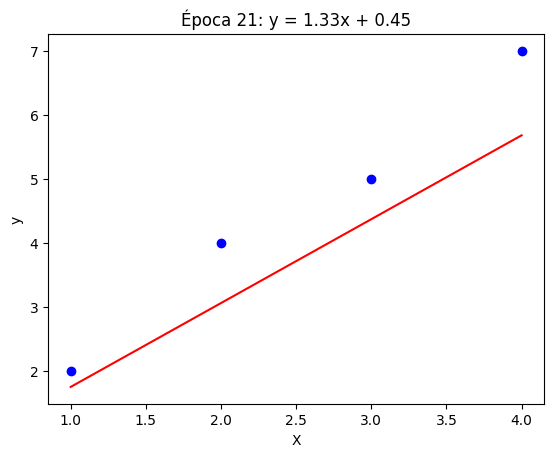

Época 21:
Erro: [-0.24634892 -0.93679974 -0.62725056 -1.31770139]
dw: -2.3181, db: -0.7820
w: 1.3327, b: 0.4519



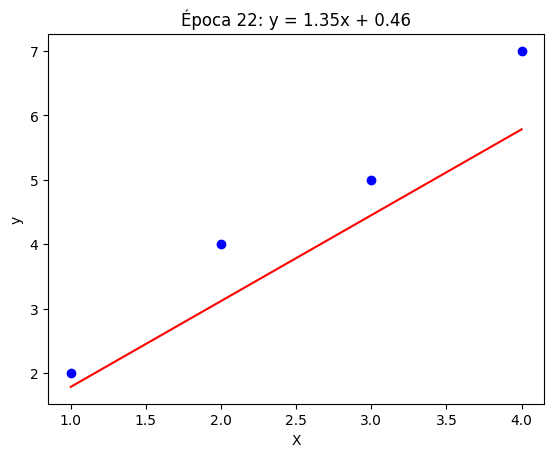

Época 22:
Erro: [-0.2153474  -0.88261696 -0.54988652 -1.21715608]
dw: -2.1247, db: -0.7163
w: 1.3540, b: 0.4591



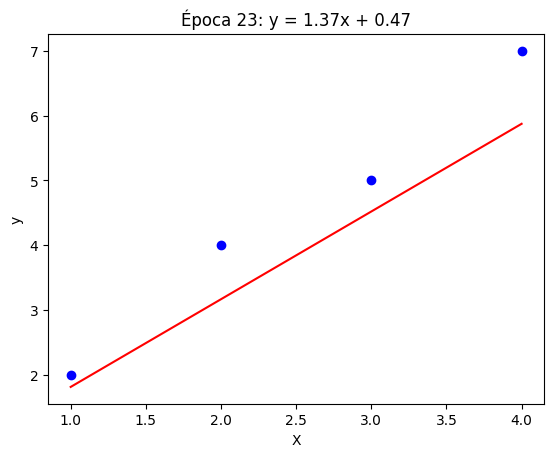

Época 23:
Erro: [-0.18693772 -0.83296012 -0.47898251 -1.12500491]
dw: -1.9475, db: -0.6560
w: 1.3735, b: 0.4656



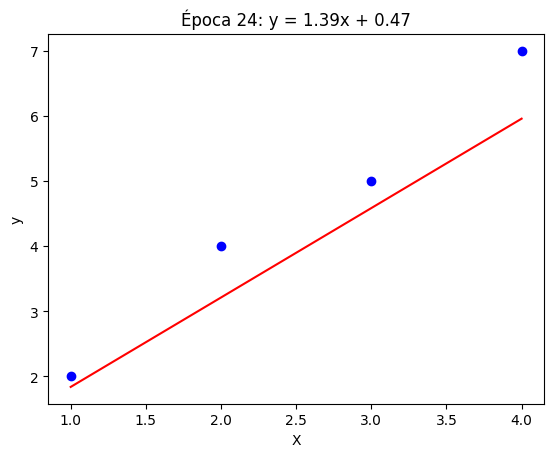

Época 24:
Erro: [-0.16090345 -0.78745128 -0.41399911 -1.04054694]
dw: -1.7850, db: -0.6007
w: 1.3913, b: 0.4717



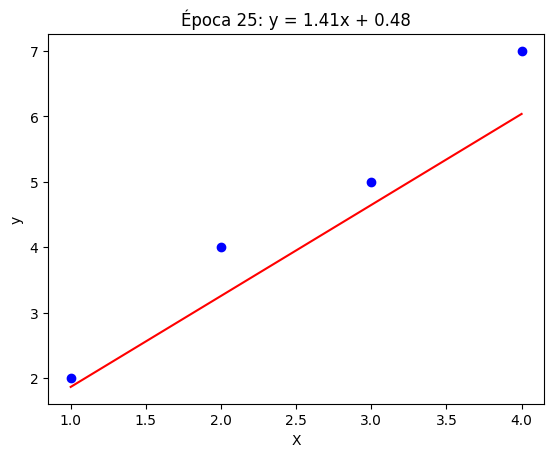

Época 25:
Erro: [-0.13704622 -0.74574407 -0.35444193 -0.96313978]
dw: -1.6361, db: -0.5501
w: 1.4077, b: 0.4772



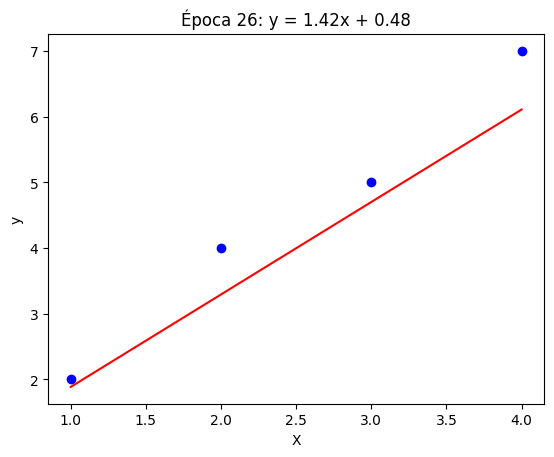

Época 26:
Erro: [-0.11518424 -0.70752104 -0.29985785 -0.89219466]
dw: -1.4996, db: -0.5037
w: 1.4227, b: 0.4822



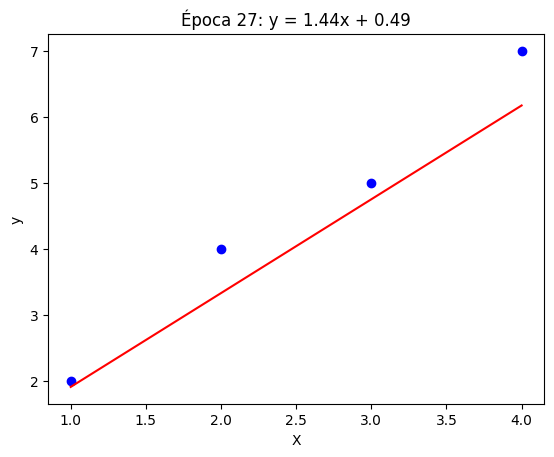

Época 27:
Erro: [-0.0951509  -0.67249126 -0.24983162 -0.82717198]
dw: -1.3746, db: -0.4612
w: 1.4364, b: 0.4868



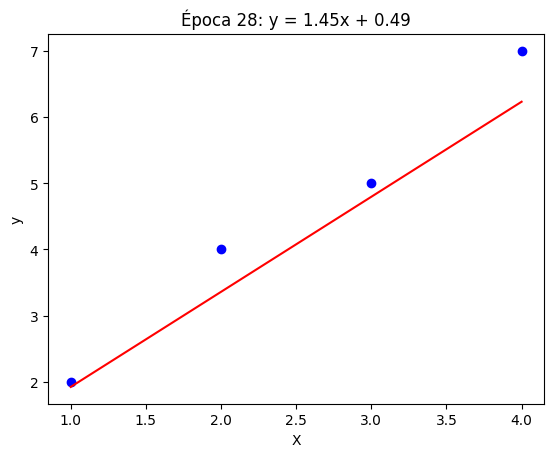

Época 28:
Erro: [-0.07679349 -0.64038806 -0.20398263 -0.7675772 ]
dw: -1.2600, db: -0.4222
w: 1.4490, b: 0.4910



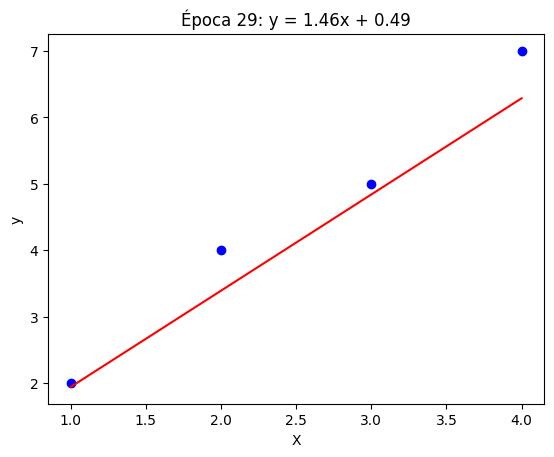

Época 29:
Erro: [-0.05997207 -0.61096708 -0.16196208 -0.71295709]
dw: -1.1549, db: -0.3865
w: 1.4606, b: 0.4949



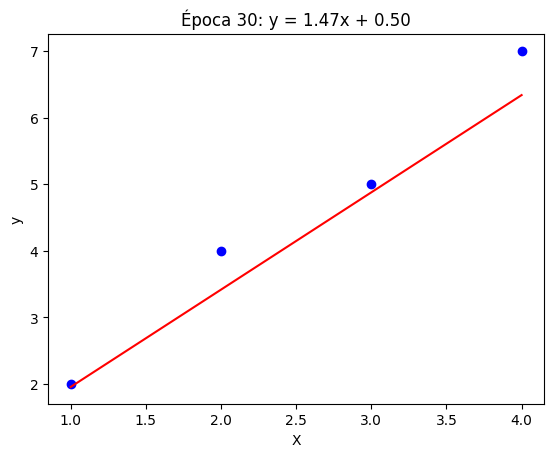

Época 30:
Erro: [-0.04455837 -0.58400433 -0.12345028 -0.66289623]
dw: -1.0586, db: -0.3537
w: 1.4711, b: 0.4984



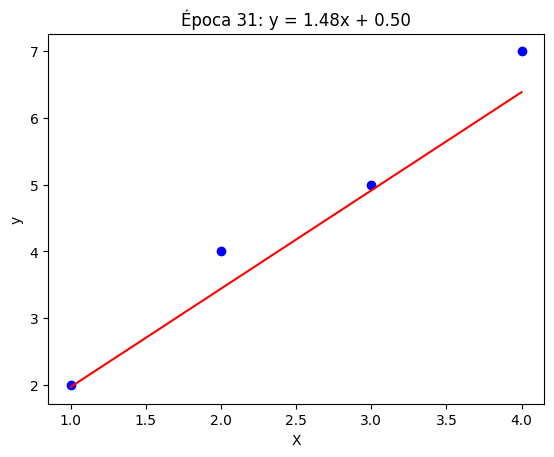

Época 31:
Erro: [-0.03043484 -0.55929454 -0.08815424 -0.61701393]
dw: -0.9704, db: -0.3237
w: 1.4808, b: 0.5017



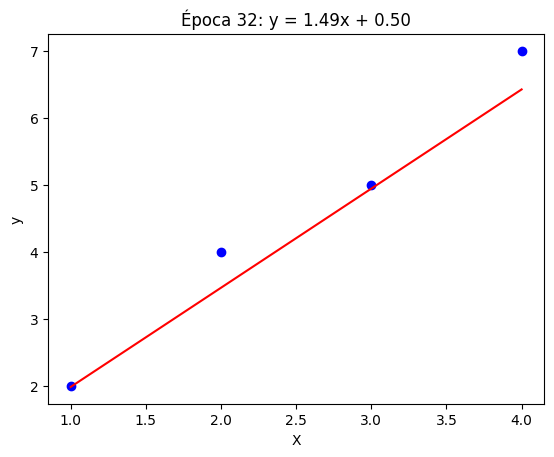

Época 32:
Erro: [-0.01749375 -0.53664958 -0.05580542 -0.57496126]
dw: -0.8895, db: -0.2962
w: 1.4897, b: 0.5046



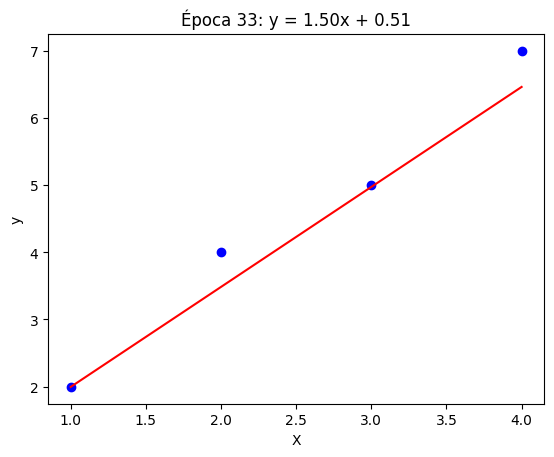

Época 33:
Erro: [-0.00563633 -0.51589704 -0.02615774 -0.53641845]
dw: -0.8154, db: -0.2710
w: 1.4979, b: 0.5073



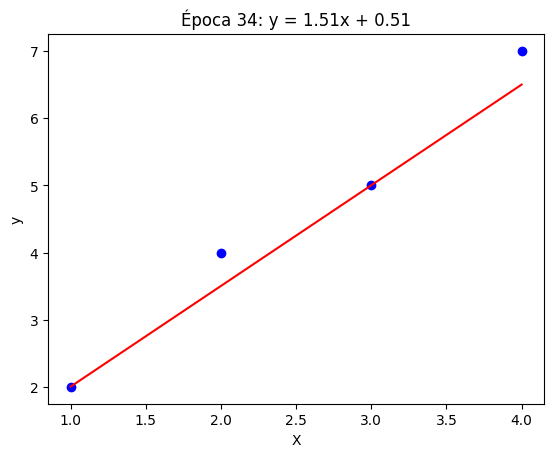

Época 34:
Erro: [ 0.00522788 -0.49687888  0.00101436 -0.5010924 ]
dw: -0.7475, db: -0.2479
w: 1.5054, b: 0.5098



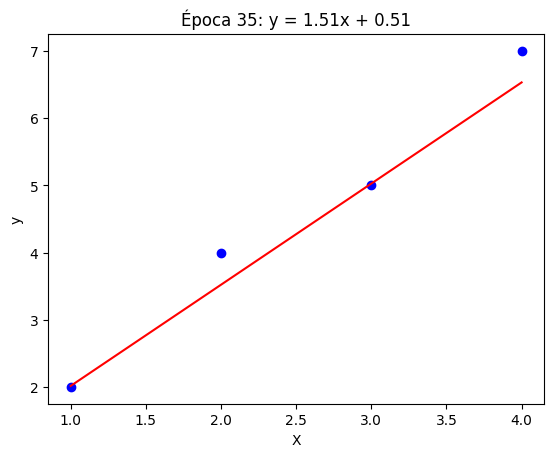

Época 35:
Erro: [ 0.01518185 -0.47945027  0.02591761 -0.46871451]
dw: -0.6852, db: -0.2268
w: 1.5122, b: 0.5121



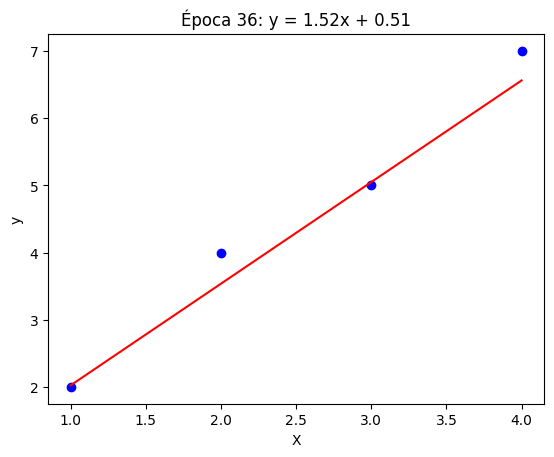

Época 36:
Erro: [ 0.02430157 -0.46347849  0.04874145 -0.43903861]
dw: -0.6281, db: -0.2074
w: 1.5185, b: 0.5142



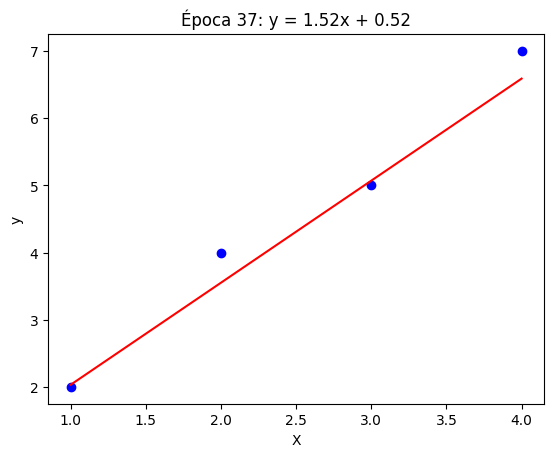

Época 37:
Erro: [ 0.03265672 -0.44884188  0.06965953 -0.41183907]
dw: -0.5759, db: -0.1896
w: 1.5243, b: 0.5161



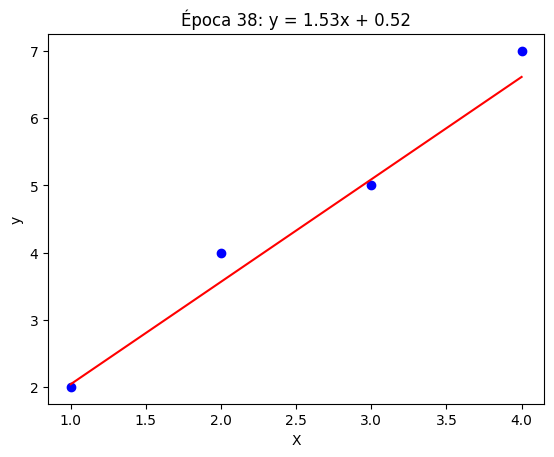

Época 38:
Erro: [ 0.04031114 -0.43542894  0.08883097 -0.38690911]
dw: -0.5279, db: -0.1733
w: 1.5295, b: 0.5178



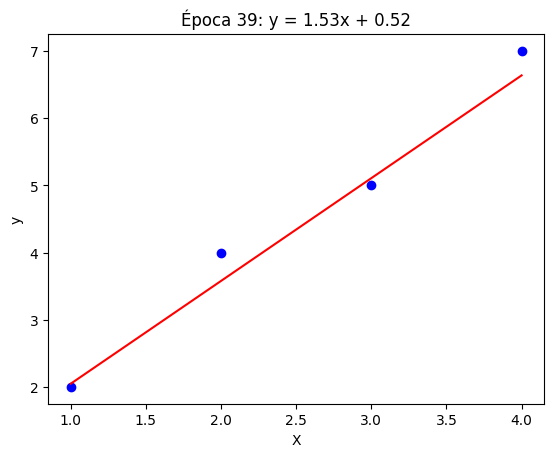

Época 39:
Erro: [ 0.04732336 -0.4231375   0.10640164 -0.36405922]
dw: -0.4840, db: -0.1584
w: 1.5344, b: 0.5194



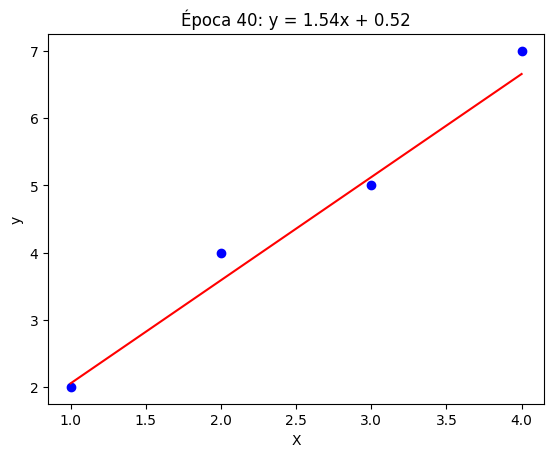

Época 40:
Erro: [ 0.053747  -0.4118739  0.1225052 -0.3431157]
dw: -0.4437, db: -0.1447
w: 1.5388, b: 0.5208



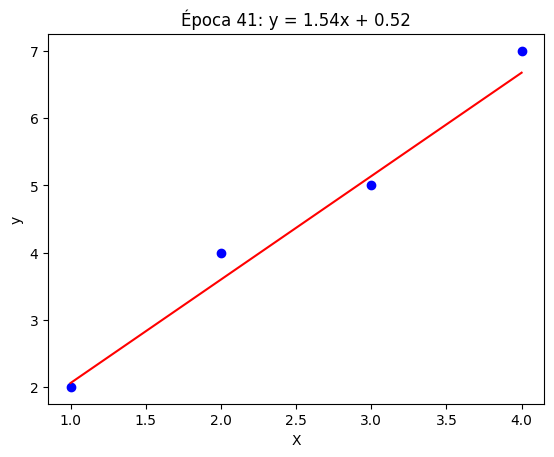

Época 41:
Erro: [ 0.05963121 -0.40155232  0.13726415 -0.32391938]
dw: -0.4068, db: -0.1321
w: 1.5429, b: 0.5221



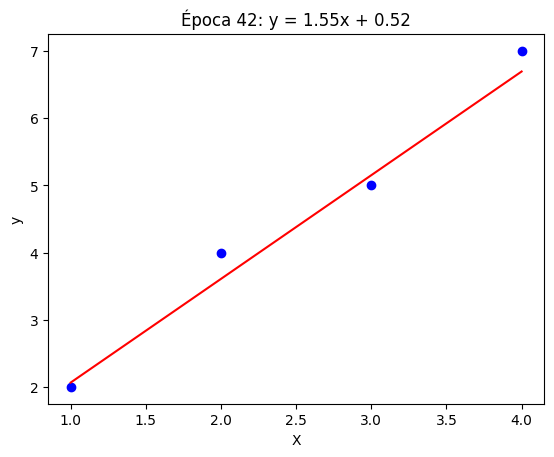

Época 42:
Erro: [ 0.06502105 -0.39209409  0.15079078 -0.30632435]
dw: -0.3730, db: -0.1207
w: 1.5466, b: 0.5233



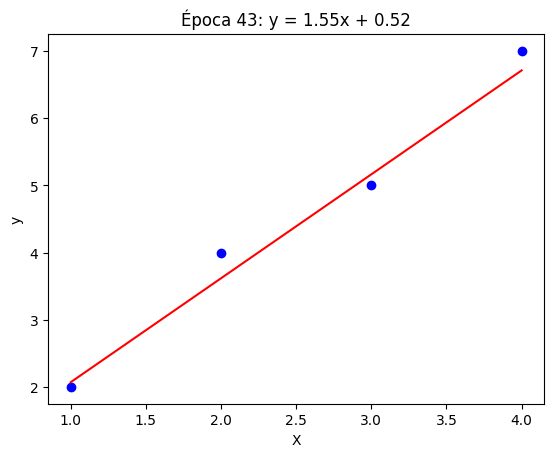

Época 43:
Erro: [ 0.06995779 -0.38342711  0.16318799 -0.29019691]
dw: -0.3420, db: -0.1101
w: 1.5500, b: 0.5244



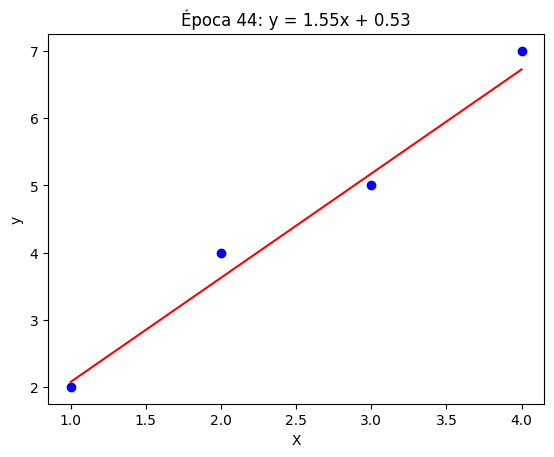

Época 44:
Erro: [ 0.07447929 -0.37548531  0.17455008 -0.27541452]
dw: -0.3136, db: -0.1005
w: 1.5532, b: 0.5254



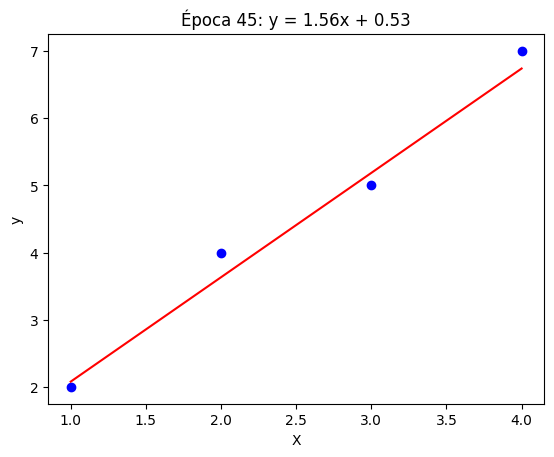

Época 45:
Erro: [ 0.07862021 -0.36820814  0.1849635  -0.26186485]
dw: -0.2876, db: -0.0916
w: 1.5560, b: 0.5264



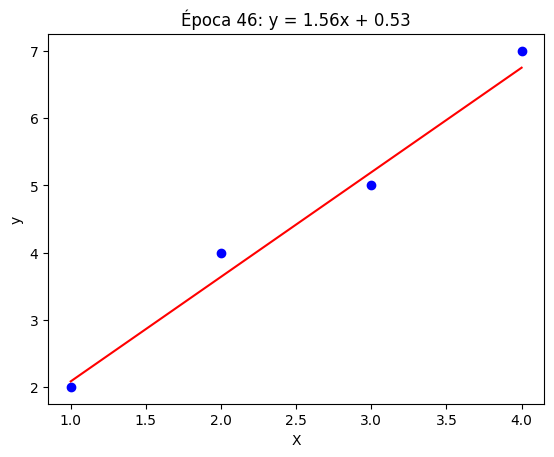

Época 46:
Erro: [ 0.08241235 -0.36154009  0.19450746 -0.24944498]
dw: -0.2637, db: -0.0835
w: 1.5587, b: 0.5272



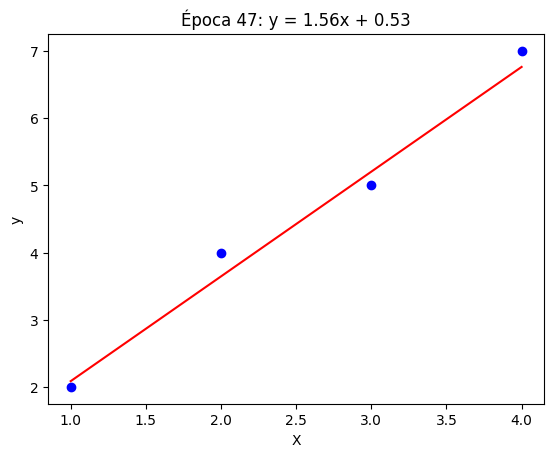

Época 47:
Erro: [ 0.08588483 -0.3554303   0.20325457 -0.23806056]
dw: -0.2419, db: -0.0761
w: 1.5611, b: 0.5280



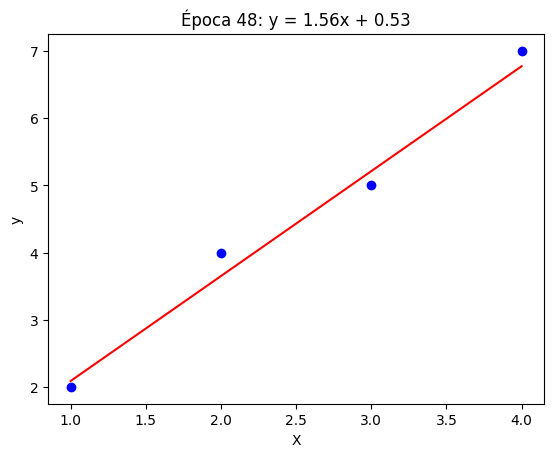

Época 48:
Erro: [ 0.08906434 -0.34983215  0.21127135 -0.22762514]
dw: -0.2218, db: -0.0693
w: 1.5633, b: 0.5287



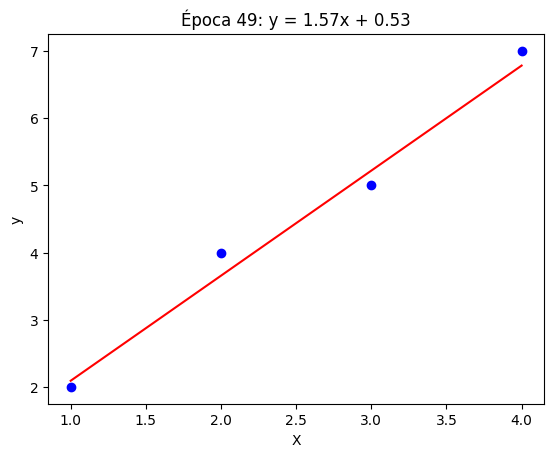

Época 49:
Erro: [ 0.09197536 -0.34470292  0.21861881 -0.21805947]
dw: -0.2035, db: -0.0630
w: 1.5654, b: 0.5293



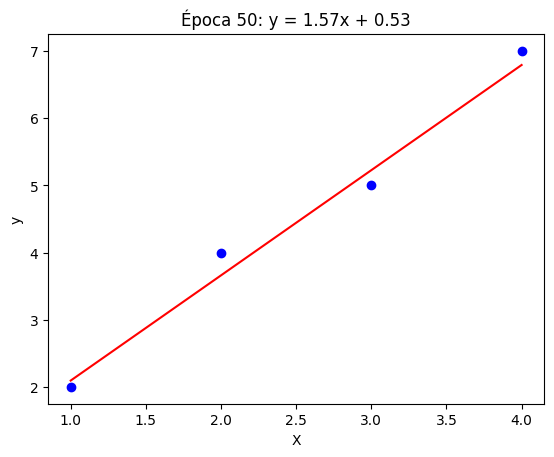

Época 50:
Erro: [ 0.09464031 -0.34000344  0.22535282 -0.20929093]
dw: -0.1866, db: -0.0573
w: 1.5672, b: 0.5299



In [49]:
import matplotlib.pyplot as plt
import numpy as np

# Dados
X = np.array([1, 2, 3, 4])
y = np.array([2, 4, 5, 7])
n = len(X)

# Inicialização
w, b = 0.0, 0.0
learning_rate = 0.01
epochs = 50

plt.ion()  # Modo interativo
plt.figure(figsize=(8, 5))

for epoch in range(epochs):
    # Forward
    y_pred = w * X + b
    errors = y_pred - y
    
    # Gradientes
    dJ_dw = (1/n) * np.sum(errors * X)
    dJ_db = (1/n) * np.sum(errors)
    
    # Atualização
    w -= learning_rate * dJ_dw
    b -= learning_rate * dJ_db
    
    # Plot (interativo)
    plt.clf()
    plt.scatter(X, y, color='blue')
    plt.plot(X, y_pred, color='red')
    plt.title(f'Época {epoch+1}: y = {w:.2f}x + {b:.2f}')
    plt.xlabel("X")
    plt.ylabel("y")
    plt.pause(0.1)
    
    # Log
    print(f"Época {epoch+1}:")
    print(f"Erro: {errors}")
    print(f"dw: {dJ_dw:.4f}, db: {dJ_db:.4f}")
    print(f"w: {w:.4f}, b: {b:.4f}\n")

plt.ioff()
plt.show()


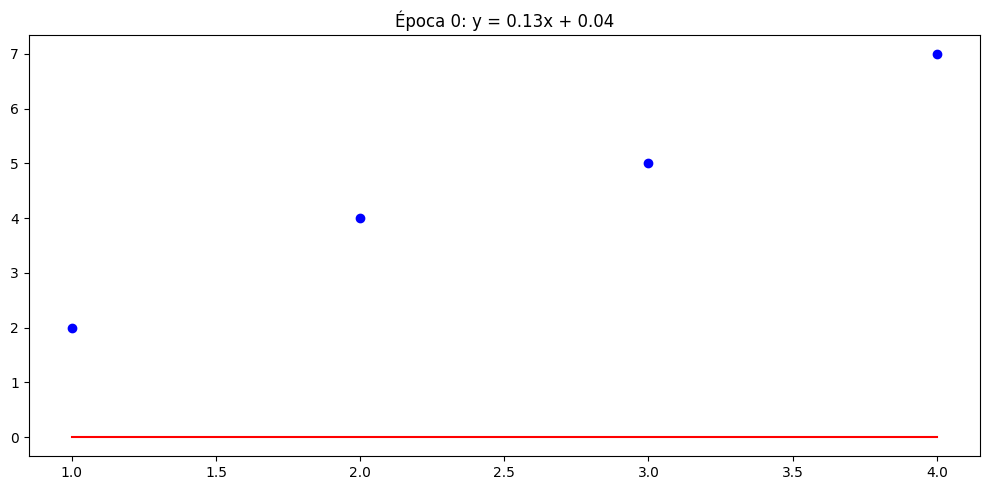

Época 0:
Erro: [-2. -4. -5. -7.]
Derivada dw: -13.2500
Derivada db: -4.5000
Novo w: 0.1325, Novo b: 0.0450



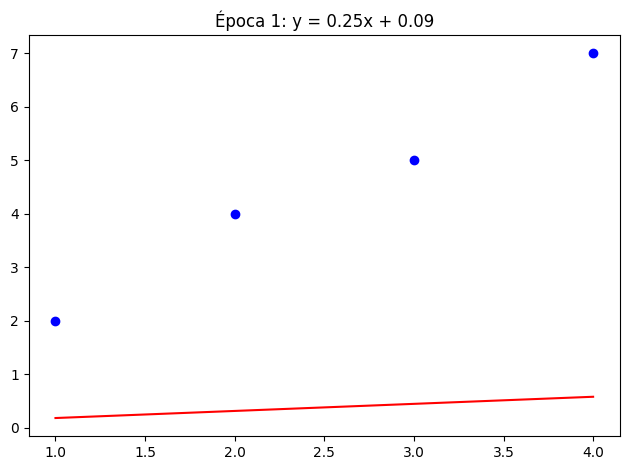

Época 1:
Erro: [-1.8225 -3.69   -4.5575 -6.425 ]
Derivada dw: -12.1438
Derivada db: -4.1238
Novo w: 0.2539, Novo b: 0.0862



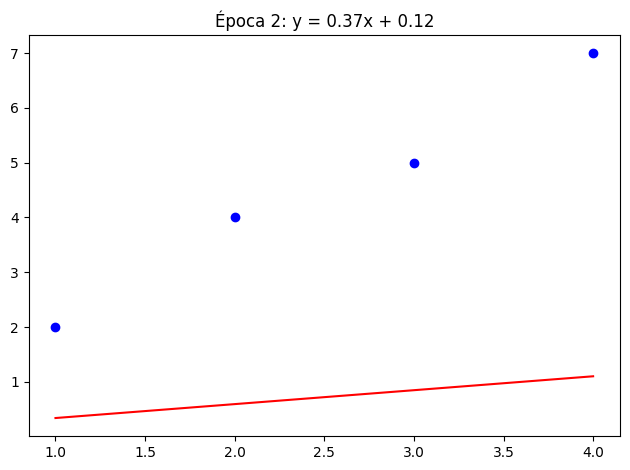

Época 2:
Erro: [-1.659825  -3.4058875 -4.15195   -5.8980125]
Derivada dw: -11.1299
Derivada db: -3.7789
Novo w: 0.3652, Novo b: 0.1240



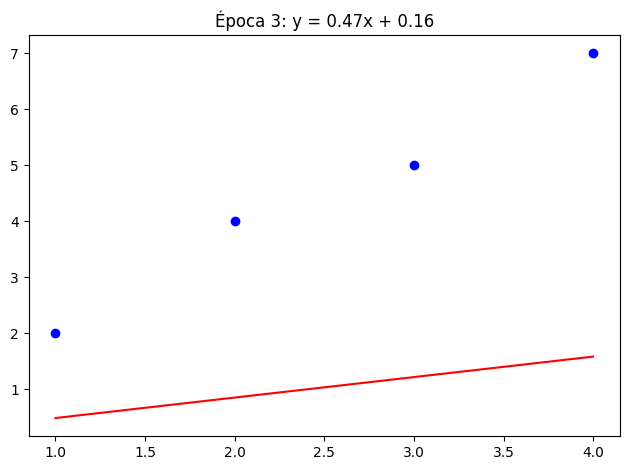

Época 3:
Erro: [-1.51073706 -3.14550081 -3.78026456 -5.41502831]
Derivada dw: -10.2007
Derivada db: -3.4629
Novo w: 0.4672, Novo b: 0.1587



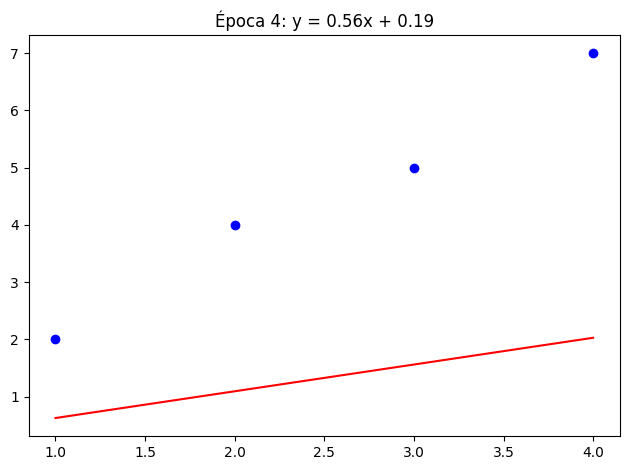

Época 4:
Erro: [-1.37410162 -2.90685876 -3.43961589 -4.97237303]
Derivada dw: -9.3490
Derivada db: -3.1732
Novo w: 0.5607, Novo b: 0.1904



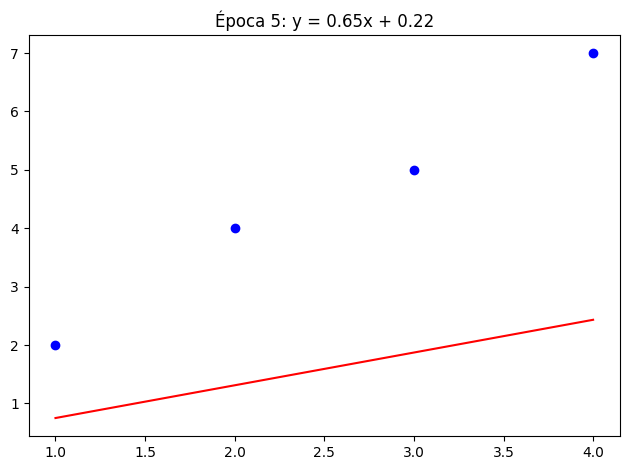

Época 5:
Erro: [-1.24887885 -2.68814559 -3.12741233 -4.56667907]
Derivada dw: -8.5685
Derivada db: -2.9078
Novo w: 0.6464, Novo b: 0.2195



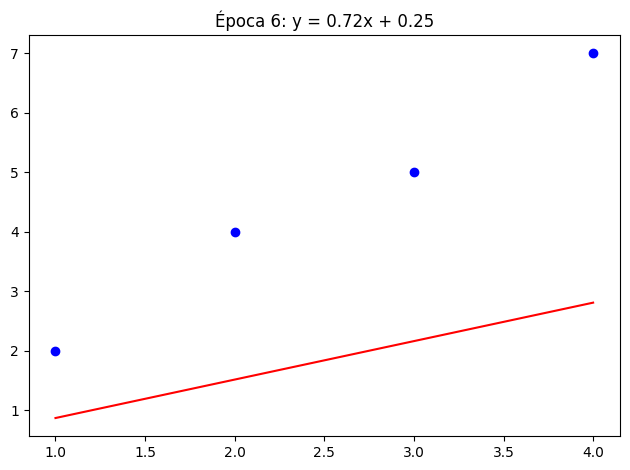

Época 6:
Erro: [-1.13411575 -2.48769718 -2.84127861 -4.19486004]
Derivada dw: -7.8532
Derivada db: -2.6645
Novo w: 0.7250, Novo b: 0.2461



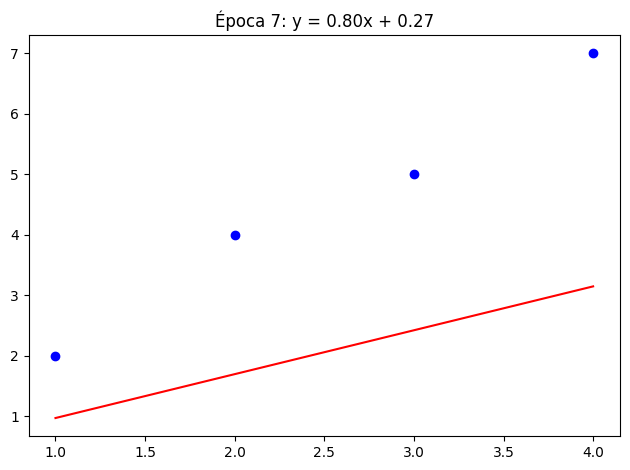

Época 7:
Erro: [-1.02893891 -2.30398837 -2.57903784 -3.8540873 ]
Derivada dw: -7.1976
Derivada db: -2.4415
Novo w: 0.7969, Novo b: 0.2705



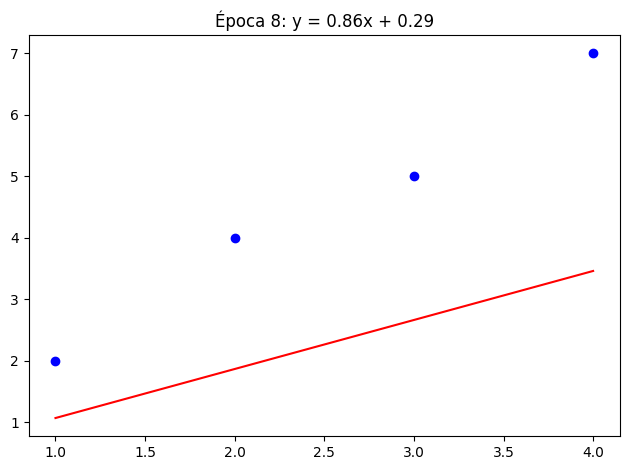

Época 8:
Erro: [-0.93254783 -2.13562135 -2.33869487 -3.54176839]
Derivada dw: -6.5967
Derivada db: -2.2372
Novo w: 0.8629, Novo b: 0.2929



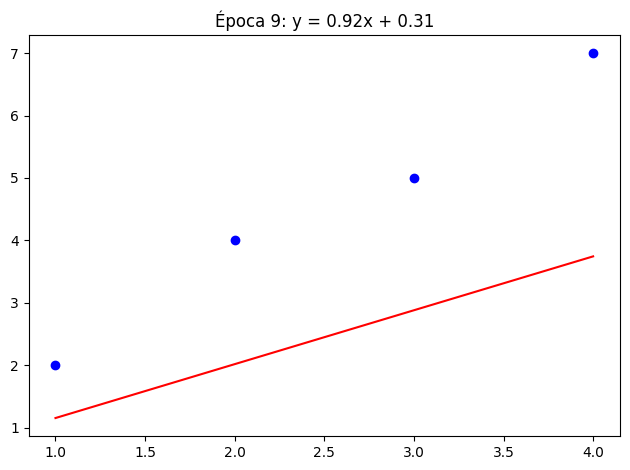

Época 9:
Erro: [-0.84420888 -1.98131503 -2.11842117 -3.25552732]
Derivada dw: -6.0461
Derivada db: -2.0499
Novo w: 0.9234, Novo b: 0.3134



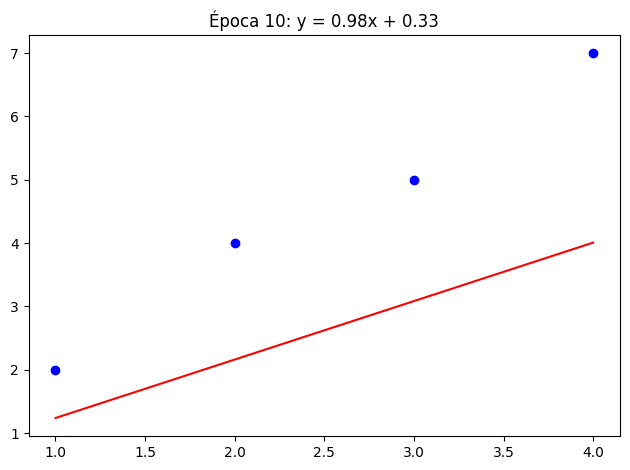

Época 10:
Erro: [-0.76324967 -1.83989529 -1.9165409  -2.99318652]
Derivada dw: -5.5414
Derivada db: -1.8782
Novo w: 0.9788, Novo b: 0.3322



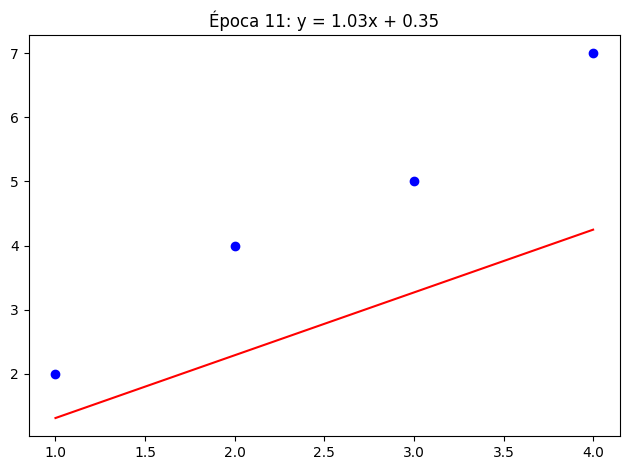

Época 11:
Erro: [-0.68905397 -1.71028606 -1.73151816 -2.75275025]
Derivada dw: -5.0788
Derivada db: -1.7209
Novo w: 1.0296, Novo b: 0.3494



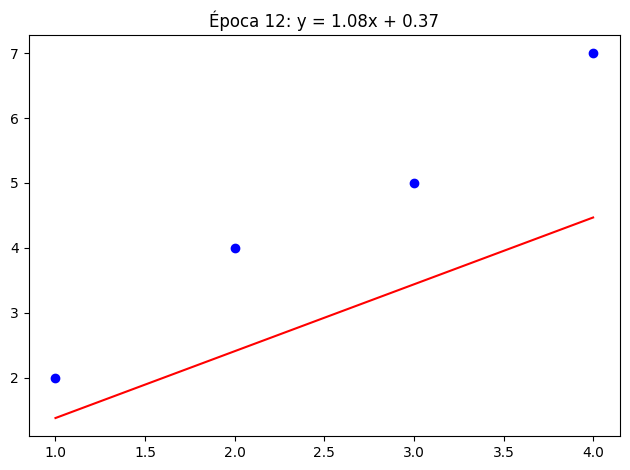

Época 12:
Erro: [-0.62105699 -1.59150113 -1.56194527 -2.53238941]
Derivada dw: -4.6549
Derivada db: -1.5767
Novo w: 1.0761, Novo b: 0.3652



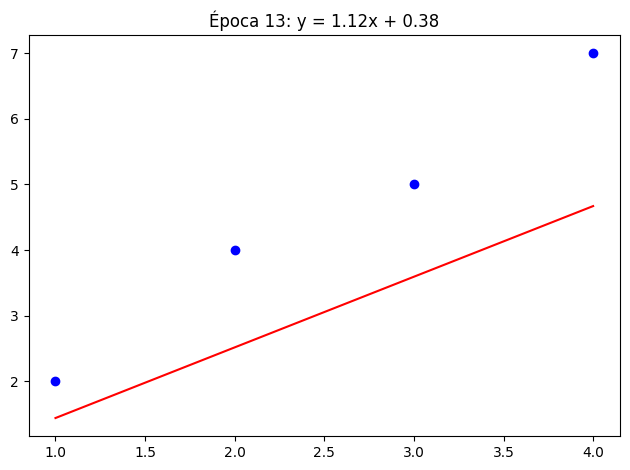

Época 13:
Erro: [-0.55874113 -1.48263664 -1.40653215 -2.33042766]
Derivada dw: -4.2663
Derivada db: -1.4446
Novo w: 1.1188, Novo b: 0.3796



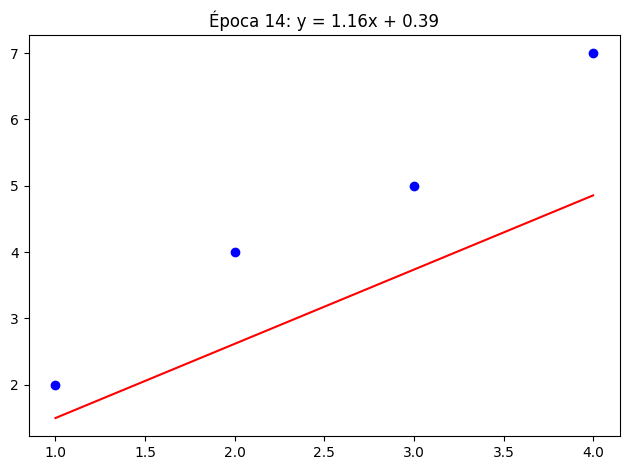

Época 14:
Erro: [-0.50163198 -1.38286418 -1.26409639 -2.1453286 ]
Derivada dw: -3.9102
Derivada db: -1.3235
Novo w: 1.1579, Novo b: 0.3928



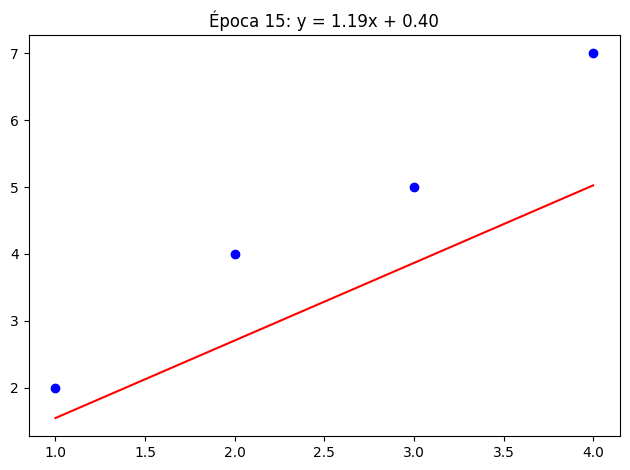

Época 15:
Erro: [-0.44929477 -1.29142456 -1.13355436 -1.97568415]
Derivada dw: -3.5839
Derivada db: -1.2125
Novo w: 1.1937, Novo b: 0.4050



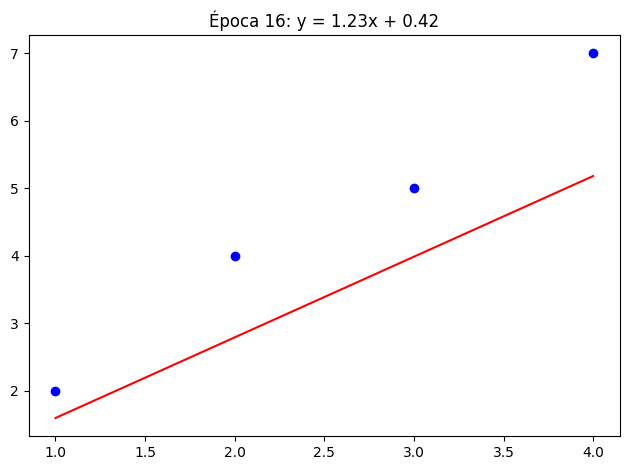

Época 16:
Erro: [-0.40133101 -1.20762195 -1.01391289 -1.82020382]
Derivada dw: -3.2848
Derivada db: -1.1108
Novo w: 1.2266, Novo b: 0.4161



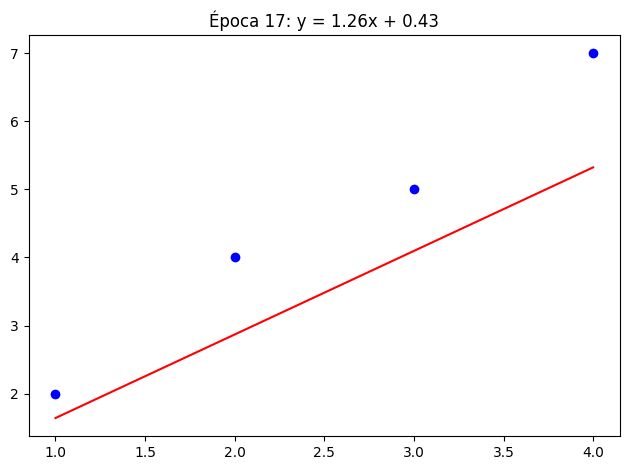

Época 17:
Erro: [-0.35737552 -1.13081863 -0.90426175 -1.67770486]
Derivada dw: -3.0107
Derivada db: -1.0175
Novo w: 1.2567, Novo b: 0.4262



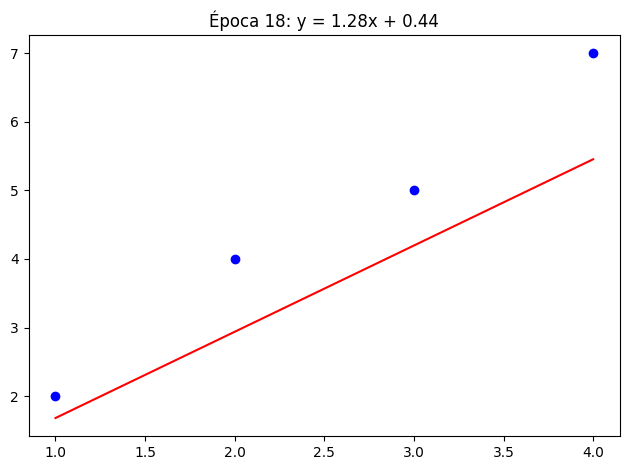

Época 18:
Erro: [-0.31709357 -1.06043014 -0.80376671 -1.54710328]
Derivada dw: -2.7594
Derivada db: -0.9321
Novo w: 1.2843, Novo b: 0.4356



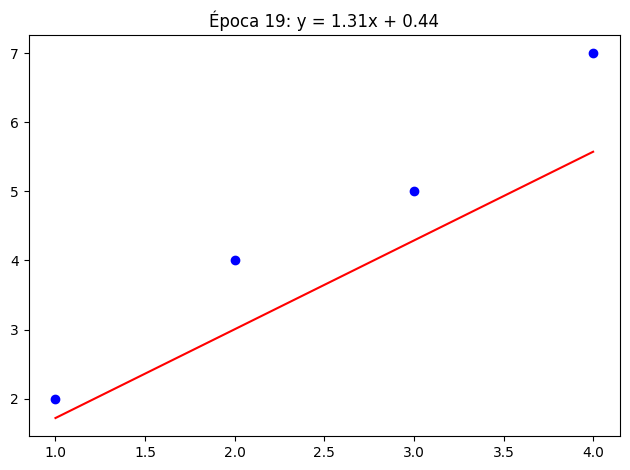

Época 19:
Erro: [-0.28017842 -0.99592082 -0.71166323 -1.42740563]
Derivada dw: -2.5292
Derivada db: -0.8538
Novo w: 1.3095, Novo b: 0.4441



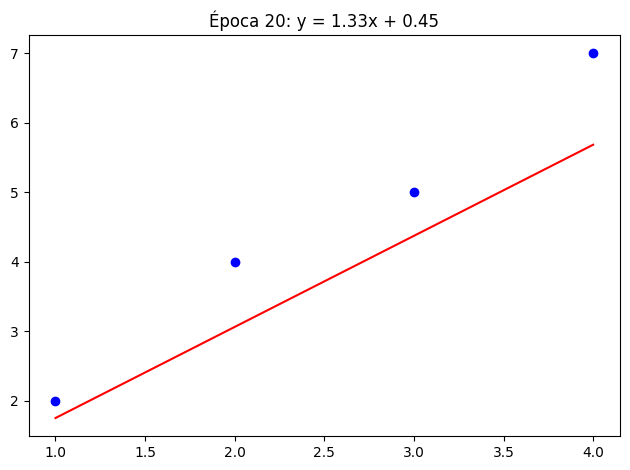

Época 20:
Erro: [-0.24634892 -0.93679974 -0.62725056 -1.31770139]
Derivada dw: -2.3181
Derivada db: -0.7820
Novo w: 1.3327, Novo b: 0.4519



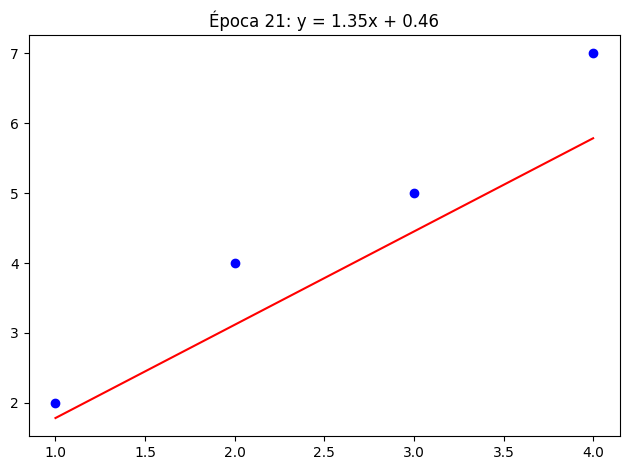

Época 21:
Erro: [-0.2153474  -0.88261696 -0.54988652 -1.21715608]
Derivada dw: -2.1247
Derivada db: -0.7163
Novo w: 1.3540, Novo b: 0.4591



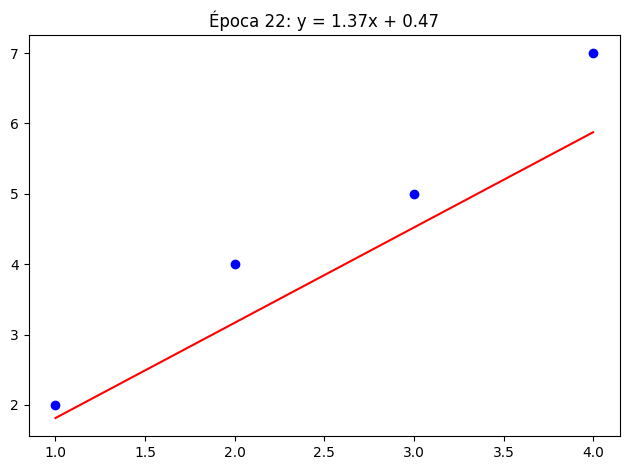

Época 22:
Erro: [-0.18693772 -0.83296012 -0.47898251 -1.12500491]
Derivada dw: -1.9475
Derivada db: -0.6560
Novo w: 1.3735, Novo b: 0.4656



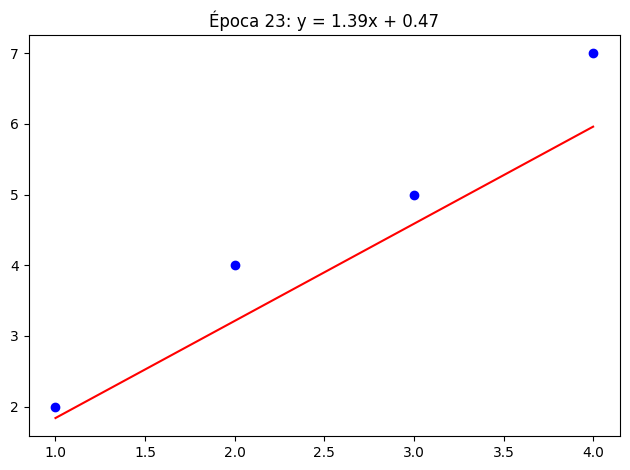

Época 23:
Erro: [-0.16090345 -0.78745128 -0.41399911 -1.04054694]
Derivada dw: -1.7850
Derivada db: -0.6007
Novo w: 1.3913, Novo b: 0.4717



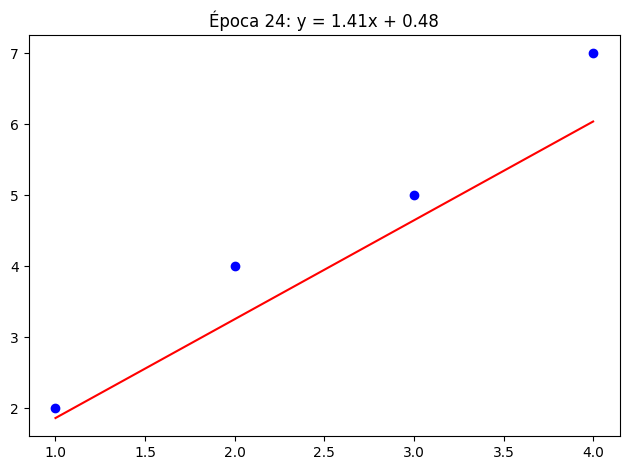

Época 24:
Erro: [-0.13704622 -0.74574407 -0.35444193 -0.96313978]
Derivada dw: -1.6361
Derivada db: -0.5501
Novo w: 1.4077, Novo b: 0.4772



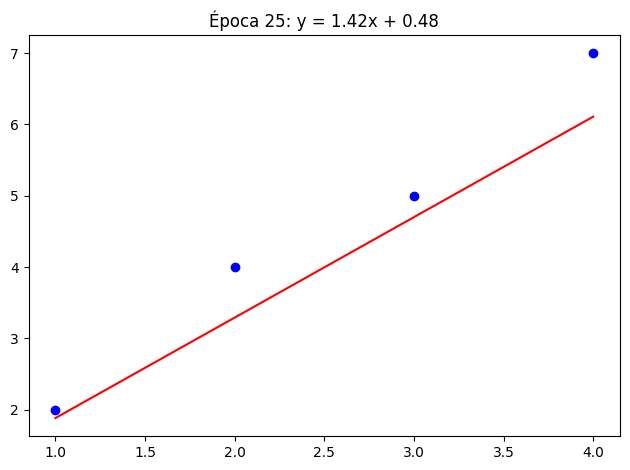

Época 25:
Erro: [-0.11518424 -0.70752104 -0.29985785 -0.89219466]
Derivada dw: -1.4996
Derivada db: -0.5037
Novo w: 1.4227, Novo b: 0.4822



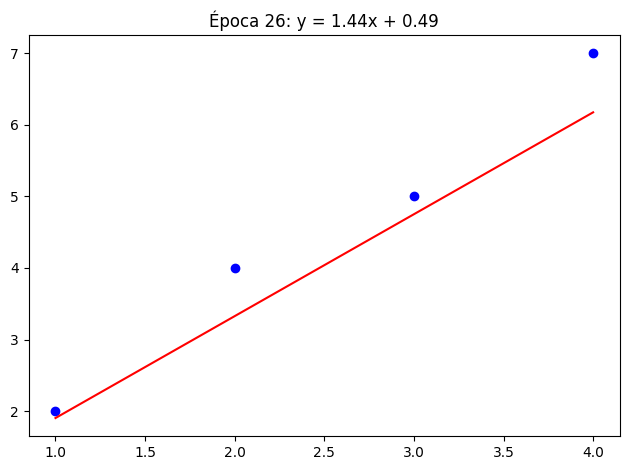

Época 26:
Erro: [-0.0951509  -0.67249126 -0.24983162 -0.82717198]
Derivada dw: -1.3746
Derivada db: -0.4612
Novo w: 1.4364, Novo b: 0.4868



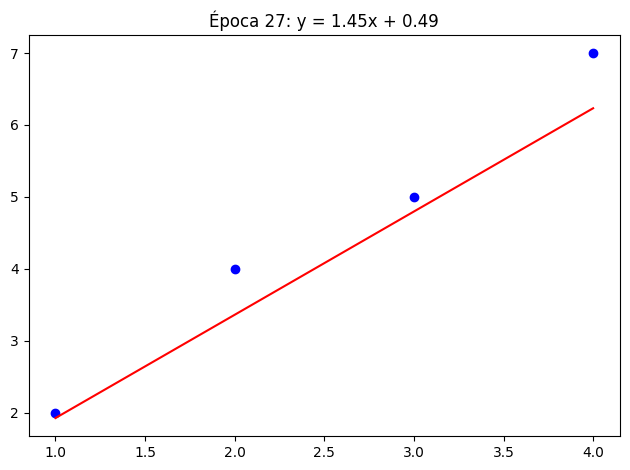

Época 27:
Erro: [-0.07679349 -0.64038806 -0.20398263 -0.7675772 ]
Derivada dw: -1.2600
Derivada db: -0.4222
Novo w: 1.4490, Novo b: 0.4910



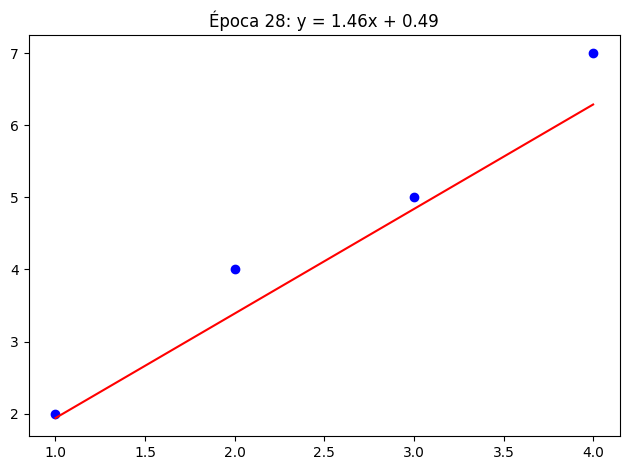

Época 28:
Erro: [-0.05997207 -0.61096708 -0.16196208 -0.71295709]
Derivada dw: -1.1549
Derivada db: -0.3865
Novo w: 1.4606, Novo b: 0.4949



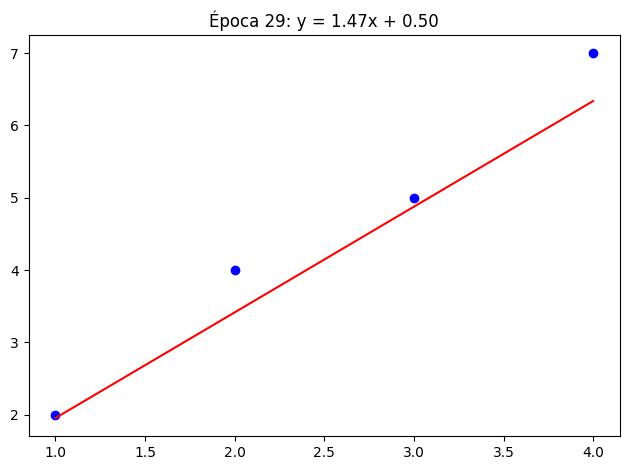

Época 29:
Erro: [-0.04455837 -0.58400433 -0.12345028 -0.66289623]
Derivada dw: -1.0586
Derivada db: -0.3537
Novo w: 1.4711, Novo b: 0.4984



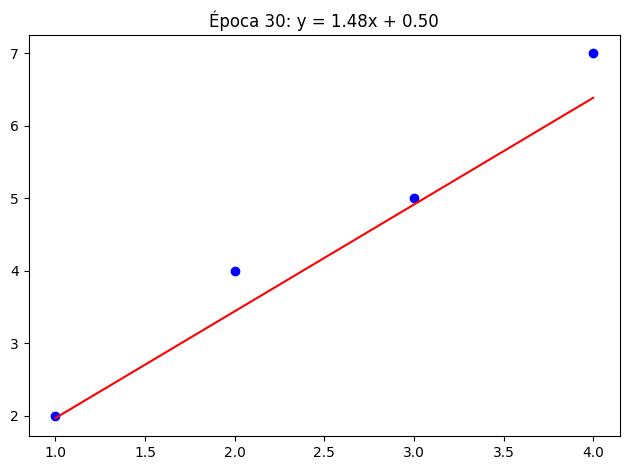

Época 30:
Erro: [-0.03043484 -0.55929454 -0.08815424 -0.61701393]
Derivada dw: -0.9704
Derivada db: -0.3237
Novo w: 1.4808, Novo b: 0.5017



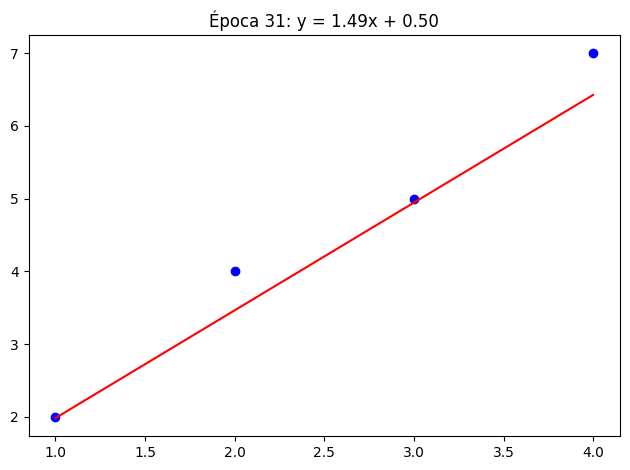

Época 31:
Erro: [-0.01749375 -0.53664958 -0.05580542 -0.57496126]
Derivada dw: -0.8895
Derivada db: -0.2962
Novo w: 1.4897, Novo b: 0.5046



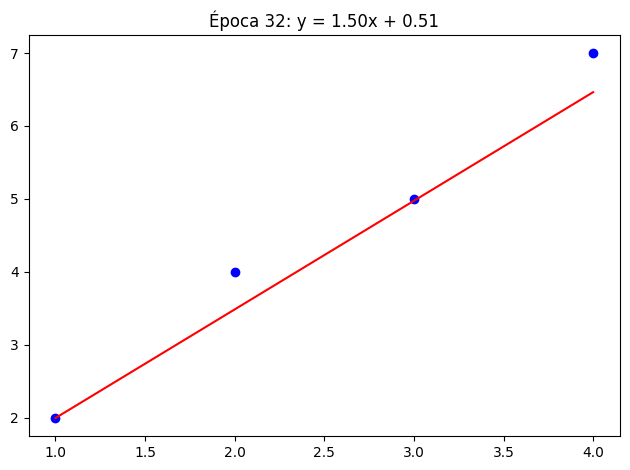

Época 32:
Erro: [-0.00563633 -0.51589704 -0.02615774 -0.53641845]
Derivada dw: -0.8154
Derivada db: -0.2710
Novo w: 1.4979, Novo b: 0.5073



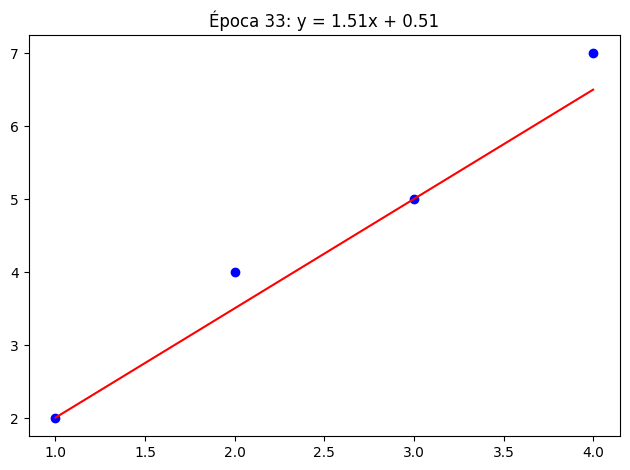

Época 33:
Erro: [ 0.00522788 -0.49687888  0.00101436 -0.5010924 ]
Derivada dw: -0.7475
Derivada db: -0.2479
Novo w: 1.5054, Novo b: 0.5098



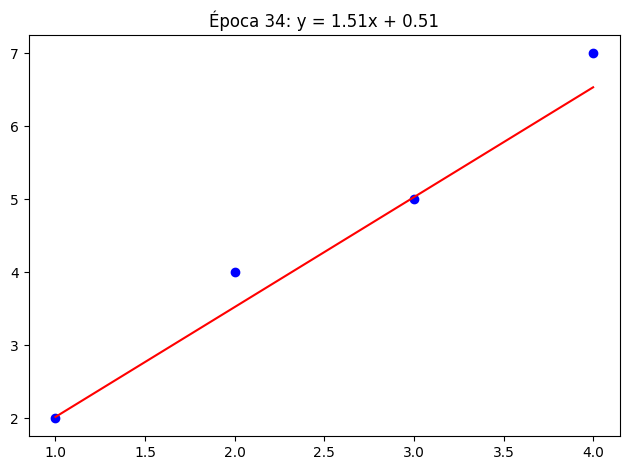

Época 34:
Erro: [ 0.01518185 -0.47945027  0.02591761 -0.46871451]
Derivada dw: -0.6852
Derivada db: -0.2268
Novo w: 1.5122, Novo b: 0.5121



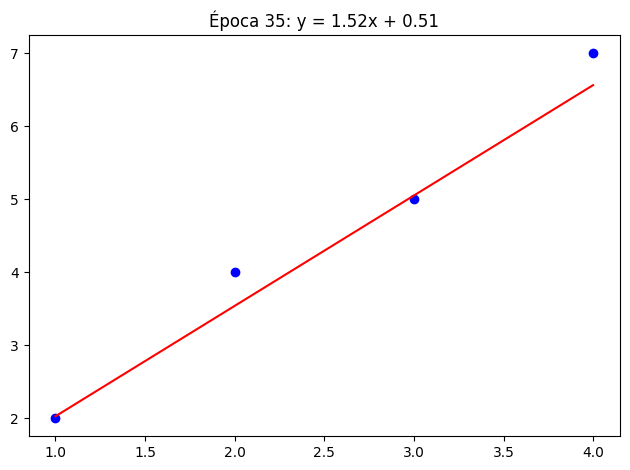

Época 35:
Erro: [ 0.02430157 -0.46347849  0.04874145 -0.43903861]
Derivada dw: -0.6281
Derivada db: -0.2074
Novo w: 1.5185, Novo b: 0.5142



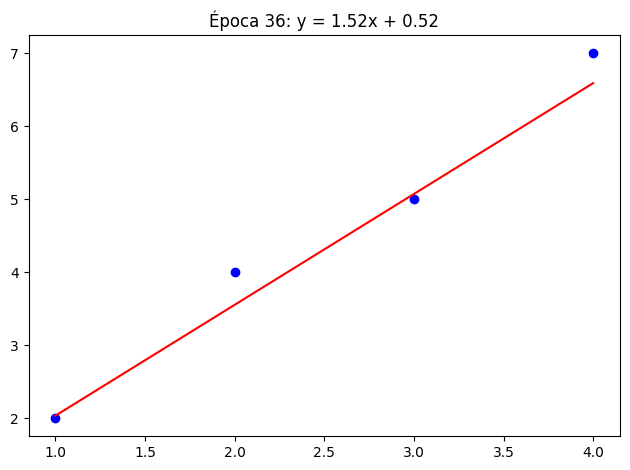

Época 36:
Erro: [ 0.03265672 -0.44884188  0.06965953 -0.41183907]
Derivada dw: -0.5759
Derivada db: -0.1896
Novo w: 1.5243, Novo b: 0.5161



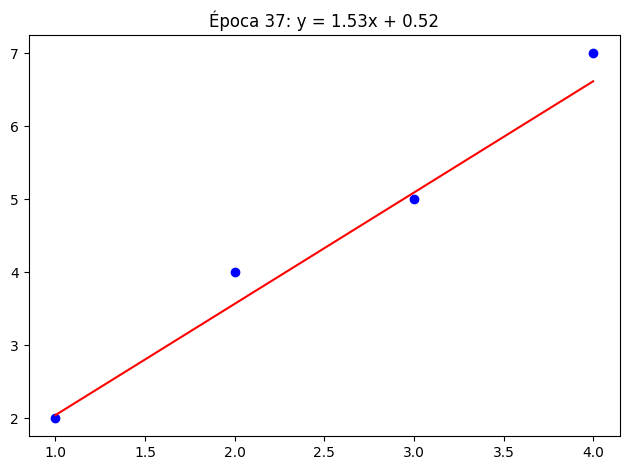

Época 37:
Erro: [ 0.04031114 -0.43542894  0.08883097 -0.38690911]
Derivada dw: -0.5279
Derivada db: -0.1733
Novo w: 1.5295, Novo b: 0.5178



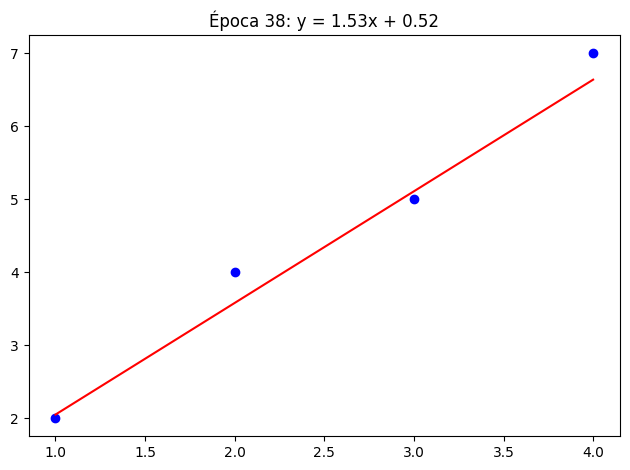

Época 38:
Erro: [ 0.04732336 -0.4231375   0.10640164 -0.36405922]
Derivada dw: -0.4840
Derivada db: -0.1584
Novo w: 1.5344, Novo b: 0.5194



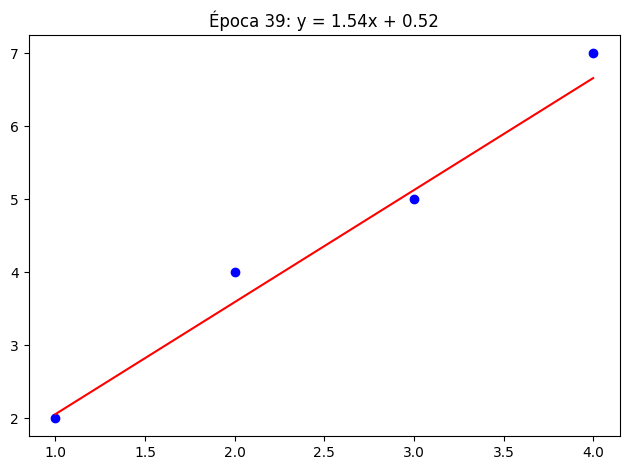

Época 39:
Erro: [ 0.053747  -0.4118739  0.1225052 -0.3431157]
Derivada dw: -0.4437
Derivada db: -0.1447
Novo w: 1.5388, Novo b: 0.5208



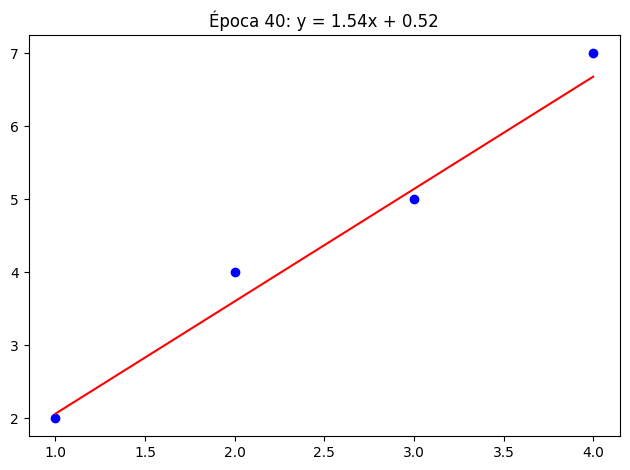

Época 40:
Erro: [ 0.05963121 -0.40155232  0.13726415 -0.32391938]
Derivada dw: -0.4068
Derivada db: -0.1321
Novo w: 1.5429, Novo b: 0.5221



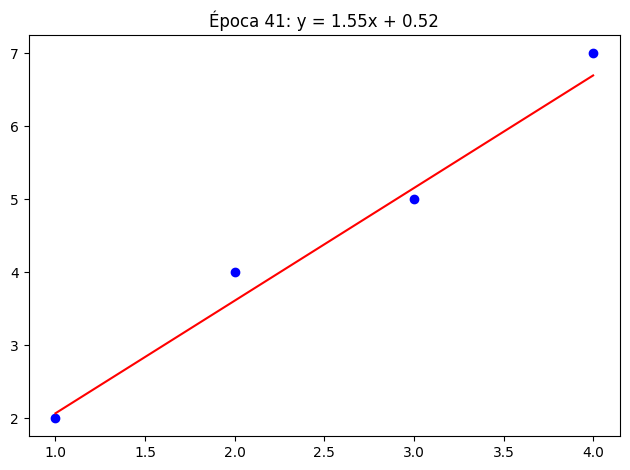

Época 41:
Erro: [ 0.06502105 -0.39209409  0.15079078 -0.30632435]
Derivada dw: -0.3730
Derivada db: -0.1207
Novo w: 1.5466, Novo b: 0.5233



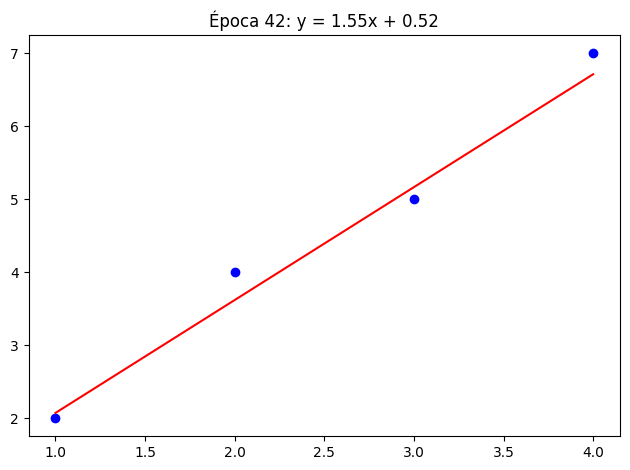

Época 42:
Erro: [ 0.06995779 -0.38342711  0.16318799 -0.29019691]
Derivada dw: -0.3420
Derivada db: -0.1101
Novo w: 1.5500, Novo b: 0.5244



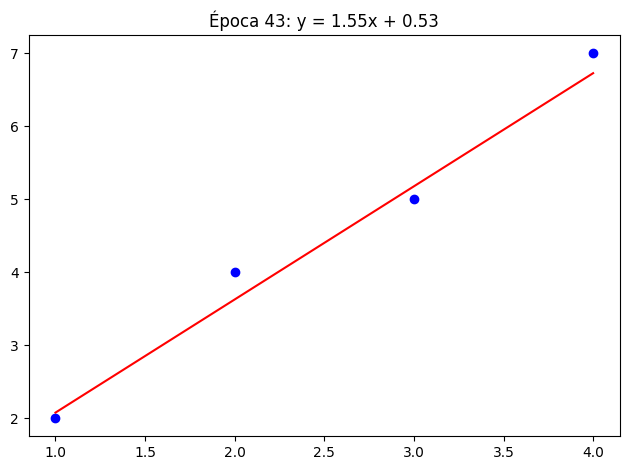

Época 43:
Erro: [ 0.07447929 -0.37548531  0.17455008 -0.27541452]
Derivada dw: -0.3136
Derivada db: -0.1005
Novo w: 1.5532, Novo b: 0.5254



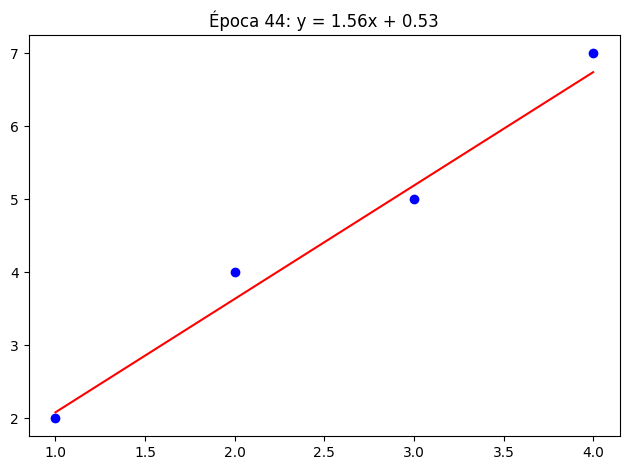

Época 44:
Erro: [ 0.07862021 -0.36820814  0.1849635  -0.26186485]
Derivada dw: -0.2876
Derivada db: -0.0916
Novo w: 1.5560, Novo b: 0.5264



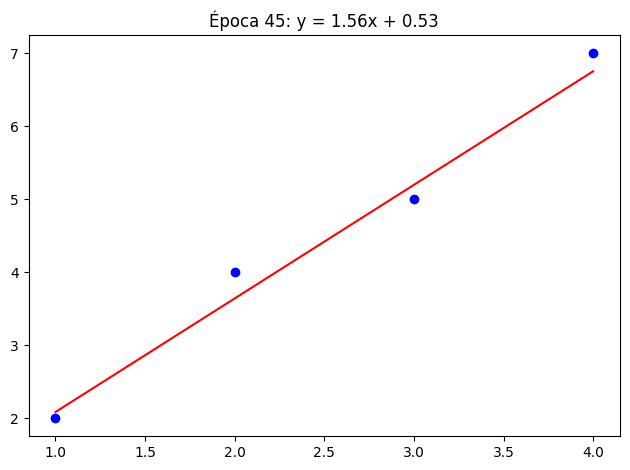

Época 45:
Erro: [ 0.08241235 -0.36154009  0.19450746 -0.24944498]
Derivada dw: -0.2637
Derivada db: -0.0835
Novo w: 1.5587, Novo b: 0.5272



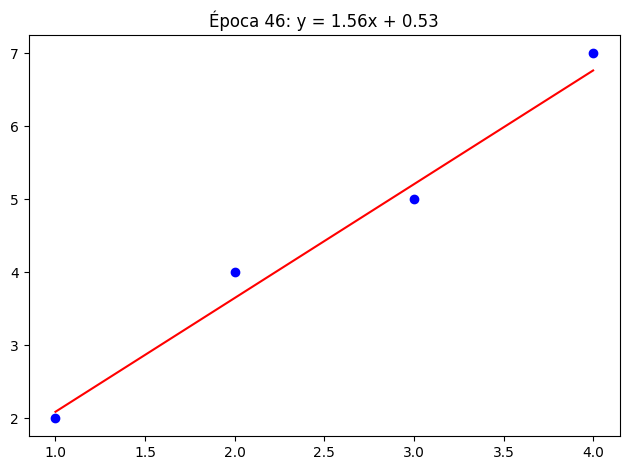

Época 46:
Erro: [ 0.08588483 -0.3554303   0.20325457 -0.23806056]
Derivada dw: -0.2419
Derivada db: -0.0761
Novo w: 1.5611, Novo b: 0.5280



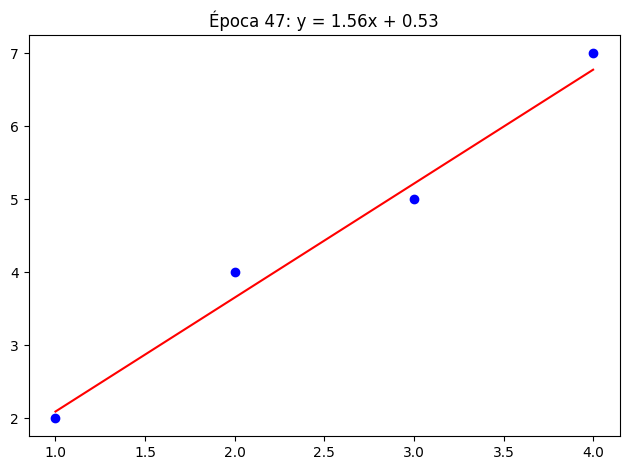

Época 47:
Erro: [ 0.08906434 -0.34983215  0.21127135 -0.22762514]
Derivada dw: -0.2218
Derivada db: -0.0693
Novo w: 1.5633, Novo b: 0.5287



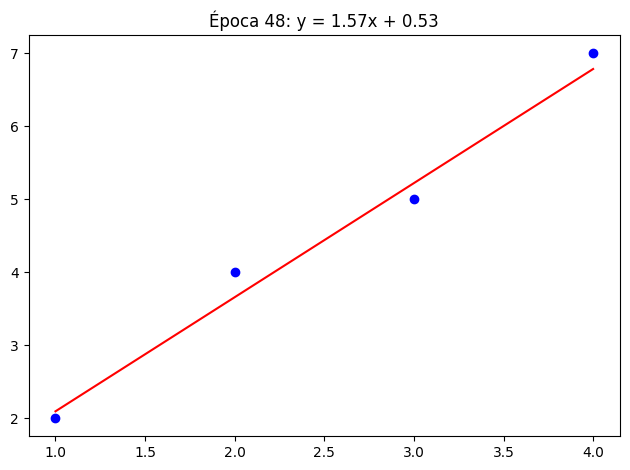

Época 48:
Erro: [ 0.09197536 -0.34470292  0.21861881 -0.21805947]
Derivada dw: -0.2035
Derivada db: -0.0630
Novo w: 1.5654, Novo b: 0.5293



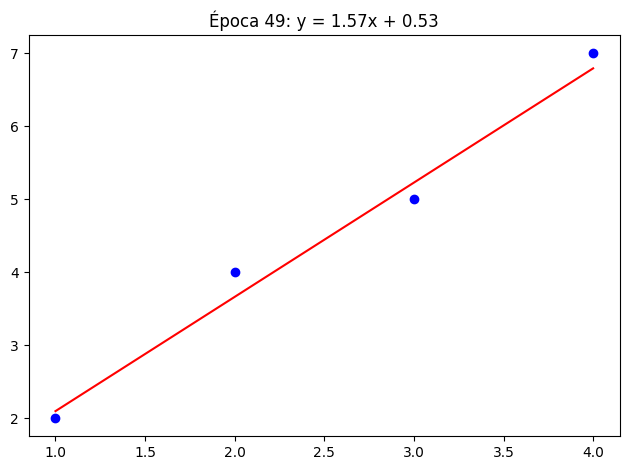

Época 49:
Erro: [ 0.09464031 -0.34000344  0.22535282 -0.20929093]
Derivada dw: -0.1866
Derivada db: -0.0573
Novo w: 1.5672, Novo b: 0.5299



In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Dados de exemplo
X = np.array([1, 2, 3, 4])  # Variável independente
y = np.array([2, 4, 5, 7])   # Variável dependente


# Reinicializa parâmetros
w, b = 0.0, 0.0
learning_rate = 0.01
epochs = 50  # Vamos fazer poucas épocas para visualização

plt.figure(figsize=(10, 5))

for epoch in range(epochs):
    # Cálculos
    y_pred = w * X + b
    errors = y_pred - y
    dJ_dw = (1/n) * np.sum(errors * X)
    dJ_db = (1/n) * np.sum(errors)
    
    # Atualização
    w = w - learning_rate * dJ_dw
    b = b - learning_rate * dJ_db
    
    # Plot
    #plt.subplot(1, 2, 1)
    plt.scatter(X, y, color='blue')
    plt.plot(X, y_pred, color='red')
    plt.title(f'Época {epoch}: y = {w:.2f}x + {b:.2f}')

    plt.tight_layout()
    plt.show()
    
    print(f"Época {epoch}:")
    print(f"Erro: {errors}")
    print(f"Derivada dw: {dJ_dw:.4f}")
    print(f"Derivada db: {dJ_db:.4f}")
    print(f"Novo w: {w:.4f}, Novo b: {b:.4f}\n")

# Atividade F

In [95]:
import torch

# Parâmetros fixos
w1 = torch.tensor(3.34)
w2 = torch.tensor(-3.53)
b1 = torch.tensor(-1.43)
b2 = torch.tensor(0.57)
w3 = torch.tensor(-1.22)
w4 = torch.tensor(-2.30)

# Inicialize b3 como um tensor com gradiente para otimização
b3 = torch.tensor(0.0, requires_grad=True)


In [96]:
def softplus(z):
    return torch.log1p(torch.exp(z))  # log(1 + exp(z))

def model(x, b3):
    z1 = w1 * x + b1
    z2 = w2 * x + b2
    a1 = softplus(z1)
    a2 = softplus(z2)
    y = w3 * a1 + w4 * a2 + b3
    return y


In [97]:
# Exemplo de dados (entrada e saída desejada)
x_data = torch.tensor([0.0, 0.5, 1.0])
y_true = torch.tensor([0.0, 1.0, 0.0])

In [98]:
criterion = torch.nn.MSELoss()
optimizer = torch.optim.SGD([b3], lr=0.01)  # otimizar somente b3

In [99]:
for epoch in range(550):
    optimizer.zero_grad()
    y_pred = model(x_data, b3)
    loss = criterion(y_pred, y_true)
    loss.backward()
    optimizer.step()

    if epoch % 50 == 0:
        print(f"Epoch {epoch}: loss={loss.item():.6f}, b3={b3.item():.2f}")

Epoch 0: loss=6.807866, b3=0.05
Epoch 50: loss=0.902874, b3=1.68
Epoch 100: loss=0.119757, b3=2.27
Epoch 150: loss=0.015900, b3=2.49
Epoch 200: loss=0.002127, b3=2.56
Epoch 250: loss=0.000300, b3=2.59
Epoch 300: loss=0.000058, b3=2.60
Epoch 350: loss=0.000026, b3=2.61
Epoch 400: loss=0.000022, b3=2.61
Epoch 450: loss=0.000021, b3=2.61
Epoch 500: loss=0.000021, b3=2.61


# Atividade G

In [110]:
import math
import random

# Função softplus e sua derivada (sigmoid)
def softplus(z):
    return math.log1p(math.exp(z))  # log(1 + exp(z))

def sigmoid(z):
    return 1 / (1 + math.exp(-z))

# Definindo a semente para reprodutibilidade
random.seed(0)  # Escolha qualquer número inteiro

# Inicialização dos parâmetros com distribuição Gaussiana média 0 e desvio padrão 1
w1 = random.gauss(0, 1)
w2 = random.gauss(0, 1)
b1 = random.gauss(0, 1)
b2 = random.gauss(0, 1)
w3 = random.gauss(0, 1)
w4 = random.gauss(0, 1)
b3 = random.gauss(0, 1)

print(f"Pesos e biases inicializados:")
print(f"w1={w1:.4f}, w2={w2:.4f}, b1={b1:.4f}, b2={b2:.4f}, w3={w3:.4f}, w4={w4:.4f}, b3={b3:.4f}\n")

# Dados de entrada e saída desejada
data = [
    (0.0, 0.0),
    (0.5, 1.0),
    (1.0, 0.0)
]

eta = 0.1  # taxa de aprendizado
epochs = 1500  # número de épocas

for epoch in range(epochs):
    total_loss = 0.0
    #print(f"Época {epoch+1}")
    for x, y_true in data:
        # Forward pass
        z1 = w1 * x + b1
        z2 = w2 * x + b2
        a1 = softplus(z1)
        a2 = softplus(z2)
        y = w3 * a1 + w4 * a2 + b3

        # Erro e perda
        e = y - y_true
        loss = 0.5 * e * e
        total_loss += loss

        # Gradientes camada saída
        dL_dy = e
        dL_dw3 = dL_dy * a1
        dL_dw4 = dL_dy * a2
        dL_db3 = dL_dy

        # Gradientes ativações camada oculta
        dL_da1 = dL_dy * w3
        dL_da2 = dL_dy * w4

        # Derivada softplus = sigmoid
        dL_dz1 = dL_da1 * sigmoid(z1)
        dL_dz2 = dL_da2 * sigmoid(z2)

        # Gradientes pesos e biases camada oculta
        dL_dw1 = dL_dz1 * x
        dL_db1 = dL_dz1
        dL_dw2 = dL_dz2 * x
        dL_db2 = dL_dz2

        # Atualização dos parâmetros
        w1 -= eta * dL_dw1
        b1 -= eta * dL_db1
        w2 -= eta * dL_dw2
        b2 -= eta * dL_db2
        w3 -= eta * dL_dw3
        w4 -= eta * dL_dw4
        b3 -= eta * dL_db3

        #print(f"  x={x:.2f}, y_true={y_true:.2f}, y_pred={y:.4f}, loss={loss:.4f}")
        #print(f"    w1={w1:.4f}, b1={b1:.4f}, w2={w2:.4f}, b2={b2:.4f}, w3={w3:.4f}, w4={w4:.4f}, b3={b3:.4f}")

    if (epoch + 1) % 100 == 0:   
        #print(f"Loss total da época: {total_loss:.4f}\n")
        print(f"\nÉpoca {epoch+1}")
        print(f"Parâmetros finais: w1={w1:.4f}, b1={b1:.4f}, w2={w2:.4f}, b2={b2:.4f}, w3={w3:.4f}, w4={w4:.4f}, b3={b3:.4f}")

print("\nSaídas com os pesos desejados:")
for x, y_true in data:
    z1 = w1 * x + b1
    z2 = w2 * x + b2
    a1 = softplus(z1)
    a2 = softplus(z2)
    y = w3 * a1 + w4 * a2 + b3
    print(f"x={x:.2f} → y_pred={y:.4f}, y_true={y_true}")

Pesos e biases inicializados:
w1=0.9417, w2=-1.3966, b1=-0.6797, b2=0.3705, w3=-1.0163, w4=-0.0721, b3=0.1792


Época 100
Parâmetros finais: w1=0.8797, b1=-1.0016, w2=-1.5221, b2=0.2744, w3=-0.6652, w4=-0.3272, b3=0.8068

Época 200
Parâmetros finais: w1=1.1785, b1=-1.0619, w2=-1.7957, b2=0.1908, w3=-0.8158, w4=-0.5768, b3=1.0008

Época 300
Parâmetros finais: w1=1.6112, b1=-1.1610, w2=-2.2248, b2=0.1779, w3=-1.0307, w4=-0.9584, b3=1.3060

Época 400
Parâmetros finais: w1=2.1314, b1=-1.3383, w2=-2.8074, b2=0.3007, w3=-1.2867, w4=-1.4636, b3=1.7412

Época 500
Parâmetros finais: w1=2.5675, b1=-1.5331, w2=-3.3176, b2=0.4707, w3=-1.5129, w4=-1.8774, b3=2.1758

Época 600
Parâmetros finais: w1=2.7729, b1=-1.6398, w2=-3.5606, b2=0.5610, w3=-1.6244, w4=-2.0663, b3=2.4061

Época 700
Parâmetros finais: w1=2.8356, b1=-1.6744, w2=-3.6351, b2=0.5893, w3=-1.6591, w4=-2.1234, b3=2.4800

Época 800
Parâmetros finais: w1=2.8517, b1=-1.6834, w2=-3.6542, b2=0.5966, w3=-1.6681, w4=-2.1380, b3=2.4993

Época 90

In [109]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Dados e valores alvo
x_data = torch.tensor([[0.0], [0.5], [1.0]])
y_true = torch.tensor([[0.0], [1.0], [0.0]])

# Fixar semente para reprodutibilidade
torch.manual_seed(5)

# Valores-alvo
target_params = {
    'w1': 3.34,
    'w2': -3.53,
    'b1': -1.43,
    'b2': 0.57,
    'w3': -1.22,
    'w4': -2.30,
    'b3': 2.61
}

# Rede
class SimpleNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden = nn.Linear(1, 2)
        self.output = nn.Linear(2, 1)
        nn.init.normal_(self.hidden.weight, mean=0.0, std=1.0)
        nn.init.normal_(self.hidden.bias, mean=0.0, std=1.0)
        nn.init.normal_(self.output.weight, mean=0.0, std=1.0)
        nn.init.normal_(self.output.bias, mean=0.0, std=1.0)

    def forward(self, x):
        x = F.softplus(self.hidden(x))
        return self.output(x)

model = SimpleNN()
optimizer = optim.SGD(model.parameters(), lr=0.1)
criterion = nn.MSELoss()

def print_distances(model, target_params):
    with torch.no_grad():
        w1 = model.hidden.weight[0][0].item()
        w2 = model.hidden.weight[1][0].item()
        b1 = model.hidden.bias[0].item()
        b2 = model.hidden.bias[1].item()
        w3 = model.output.weight[0][0].item()
        w4 = model.output.weight[0][1].item()
        b3 = model.output.bias[0].item()

        #print("Distância para os valores-alvo:")
        #print(f"w1: {abs(w1 - target_params['w1']):.4f}")
        #print(f"w2: {abs(w2 - target_params['w2']):.4f}")
        #print(f"b1: {abs(b1 - target_params['b1']):.4f}")
        #print(f"b2: {abs(b2 - target_params['b2']):.4f}")
        #print(f"w3: {abs(w3 - target_params['w3']):.4f}")
        #print(f"w4: {abs(w4 - target_params['w4']):.4f}")
        #print(f"b3: {abs(b3 - target_params['b3']):.4f}")
        #print()
        print(f"Parametros da rede: w1 = {w1}, w2 = {w2}, b1 = {b1}, b2 = {b2}, w3 = {w3}, w4 = {w4}, b3 = {b3}")
        print()

# Treinamento
for epoch in range(1500):
    model.train()
    optimizer.zero_grad()
    y_pred = model(x_data)
    loss = criterion(y_pred, y_true)
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 100 == 0:
        print(f"Epoch {epoch}: loss = {loss.item():.6f}")
        print_distances(model, target_params)


# Teste final
model.eval()
with torch.no_grad():
    y_pred = model(x_data)
    print("\nPrevisões finais:")
    for i, x in enumerate(x_data):
        print(f"x = {x.item():.2f}, y_true = {y_true[i].item():.2f}, y_pred = {y_pred[i].item():.4f}")


Epoch 99: loss = 0.202492
Parametros da rede: w1 = 2.0147862434387207, w2 = -1.5278080701828003, b1 = -0.9015963673591614, b2 = -0.16176320612430573, w3 = -0.2100946456193924, w4 = -0.37095654010772705, b3 = 0.6351613998413086

Epoch 199: loss = 0.184561
Parametros da rede: w1 = 2.0855510234832764, w2 = -1.6910752058029175, b1 = -0.9635589122772217, b2 = -0.1068018302321434, w3 = -0.3443360924720764, w4 = -0.6489381790161133, b3 = 0.847041666507721

Epoch 299: loss = 0.157404
Parametros da rede: w1 = 2.1982011795043945, w2 = -1.9457453489303589, b1 = -1.0542064905166626, b2 = -0.016240490600466728, w3 = -0.5044992566108704, w4 = -0.9532513618469238, b3 = 1.0895979404449463

Epoch 399: loss = 0.118107
Parametros da rede: w1 = 2.3646445274353027, w2 = -2.2823028564453125, b1 = -1.173583984375, b2 = 0.10480435937643051, w3 = -0.7016411423683167, w4 = -1.2727231979370117, b3 = 1.3760136365890503

Epoch 499: loss = 0.071327
Parametros da rede: w1 = 2.5750954151153564, w2 = -2.65942788124084